# Gene Expression Analysis

## Environment

In [1]:
# Loading the Packages
%reload_ext autoreload
%autoreload 2

import os
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
from tqdm import tqdm
from scipy.signal import argrelextrema
from scipy.signal import find_peaks
import time

## load exp data

In [ ]:
# Load 20 slides exp
base_path = "./"
data_path = os.path.join(base_path, "exp_dataset/PRISM_HCC_of_20_slides/")
out_path = os.path.join(base_path, "output/")
os.makedirs(out_path, exist_ok=True)

time_list = dict()
time_list['st_load_data'] = time.time()

FOI = "HCC"
expr_path = os.path.join(data_path, "PRISM_HCC_expression_matrix_Chunr.csv")
gene_list=[
    "HBV", "AFP", "GPC3", "MKI67", "PECAM1", "EPCAM", "ACTA2",
    "CLEC9A","CD1C","LILRA4",
    "SLC4A10","CPA3",
    "C1QA","FCGR3A","S100A8","CSF3R","LYVE1",
    "CD3D","CD4","CD8A","GZMA","GZMB","CTLA4","PDCD1","CXCL13","FOXP3","PRF1", 
    "CD79A","MS4A1",
    "NCAM1","MZB1"
]

# add expression data to the AnnData object
raw_adata = pd.concat([pd.read_csv(os.path.join(data_path, f'S_{num+1}_expression_matrix.csv'), index_col=0) for num in range(20)][:20],
                      keys=[f'layer{_}' for _ in range(20)], axis=0)
layer = [_[0] for _ in raw_adata.index]
raw_adata.index = [_[1] for _ in raw_adata.index]

adata = sc.AnnData(raw_adata)
adata.obs['dataset'] = ["PRISM_HCC"] * len(adata)
adata.obs['layer'] = layer
adata.var.index = list(pd.read_csv(r'./exp_dataset/PRISM_HCC_gene_list.csv')['gene'])
adata.obs_names_make_unique()
adata.var.index = adata.var.index.str.upper()

In [58]:
# # Load one slide exp
# base_path = "./"
# data_path = os.path.join(base_path, "exp_dataset/PRISM_HCC/")
# out_path = os.path.join(base_path, "output/CTX")
# # fig_path = os.path.join(out_path, "figures")
# if not os.path.exists(out_path):
#     os.mkdir(out_path)
# field_of_in = 'HCC'
# save = False

# expr_path = os.path.join(data_path, "PRISM_HCC_expression_matrix_Chunr.csv")

# raw_adata = pd.read_csv(expr_path, index_col=0)
# adata = sc.AnnData(raw_adata)
# adata.obs['dataset'] = ["PRISM_HCC"] * len(adata)

## Preprocessing


### functions for cell-typing


In [ ]:
# Preprocessing
def adata_filter(adata, min_genes, min_counts, max_counts, min_cells):
    sc.pp.filter_cells(adata, min_genes=min_genes)
    sc.pp.filter_cells(adata, min_counts=min_counts)
    sc.pp.filter_cells(adata, max_counts=max_counts)
    sc.pp.filter_genes(adata, min_cells=min_cells)
    return adata


def QC_plot(adata, hue, min_counts='nan', max_counts='nan', min_genes='nan', min_cells='nan'):
    g = sns.JointGrid(
        data=adata.obs,
        x="total_counts",
        y="n_genes_by_counts",
        height=5,
        ratio=2,
        hue=hue,
    )
    g.fig.suptitle("QC_by_{}, cell_num={}, gene_num={}\nmin_counts={}, max_counts={}, min_genes={}, min_cells={}\n\n\n\n\n".format(hue,len(adata),len(adata.var.index),
                                                                     min_counts, max_counts, min_genes, min_cells))
    g.plot_joint(sns.scatterplot, s=40, alpha=0.3)
    g.plot_marginals(sns.kdeplot)
    g.set_axis_labels("total_counts", "n_genes_by_counts", fontsize=16)
    g.fig.set_figwidth(6)
    g.fig.set_figheight(6)
    plt.show()


def general_preprocess(adata, min_genes=2, min_counts=5, max_counts=1300, min_cells=3, auto_filter=False):
    # Plot top 20 most expressed genes
    sc.pl.highest_expr_genes(adata, n_top=10)
    # Calculate QC metrics
    sc.pp.calculate_qc_metrics(adata, percent_top=None, inplace=True)
    
    fig, ax = plt.subplots(figsize=(20,5))
    a = adata.obs.total_counts
    sns.histplot(a, bins=100, stat='density', alpha=1, kde=True,
                edgecolor='white', linewidth=0.5,
                # log=True, 
                ax=ax,
                line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'),
                # binrange=[0,100]
                )
    y = ax.get_lines()[0].get_ydata()
    maxima = [float(_/len(y)*(max(a)-min(a))+min(a)) for _ in argrelextrema(-np.array(y), np.less)[0]]
    print(f'maxima: {maxima}')
    plt.show()
    if auto_filter:
        min_counts = int(maxima[0]) - 1

    origin_cell_num = len(adata)
    QC_plot(adata, hue='dataset')

    # Filter
    adata = adata_filter(adata, min_genes, min_counts, max_counts, min_cells)
    filtered_cell_num = len(adata)
    QC_plot(adata, hue='dataset', min_genes=min_genes, min_counts=min_counts, max_counts=max_counts, min_cells=min_cells)
    return adata, origin_cell_num, filtered_cell_num


def preprocess_of_UMAP(adata):
    # Normalization scaling
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    # Scale data to unit variance and zero mean
    sc.pp.regress_out(adata, ["total_counts"])
    sc.pp.scale(adata)
    return adata


def save_pos_on_UMAP(adata, out_dir):
    try:
        adata_coor = pd.DataFrame(
            adata.obsm["X_umap"], columns=["Coor_X", "Coor_Y"], index=adata.obs.index
        )
        df = pd.concat(
            [
                adata_coor["Coor_X"],
                adata_coor["Coor_Y"],
                pd.DataFrame(adata.obs.index),
                adata.obs.leiden,
            ],
            axis=1,
        )
        df.to_csv(out_dir)
    except KeyError:
        print('X_umap not found, please perform umap first.')


def save_cell_cluster(
    adata,
    out_path,
    st_point,
    cell_num,
    name="leiden",
):
    raw_clu = dict(adata.obs[name])
    cluster = dict()
    for cell_num in raw_clu.keys():
        cluster[cell_num] = -1

    for cell in raw_clu.keys():
        cluster[int(cell) - st_point] = int(raw_clu[cell])

    with open(out_path, "wb") as handle:
        pickle.dump(cluster, handle)


def UMAP_genes_plot(adata, FOI, size=0.1, save=False, out_path='./', datatype='direct', dataset=[]):
    n_pcs = len(adata.uns['pca']['variance'])
    n_neighbors = adata.uns['neighbors']['params']['n_neighbors']
    resolution = adata.uns['leiden']['params']['resolution']
    # Plot Gene distribution
    ncols = int(-(-len(adata.var_names)**(1/2)//1))
    nrows = -(-len(adata.var_names)//ncols)
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*4, nrows*4))
    for pos, gene_name in enumerate(list(adata.var_names)):
        sc.pl.umap(
            adata[adata.obs.dataset.isin(dataset)],
            size=size,
            color=gene_name,
            legend_fontweight=100,
            legend_fontsize=20,
            ax=ax[pos // ncols][pos % ncols],
            show=False,
            vmax=5,
            vmin=0,
        )
        ax[pos // ncols][pos % ncols].set_xticklabels("")
        ax[pos // ncols][pos % ncols].set_yticklabels("")

    fig.suptitle(
        "{}\nexp:{}\nUMAP:{}\n".format(
        f"{FOI}_{datatype}_{dataset}_UMAP",
        f"cell_num={len(adata)}",
        f"n_neighbors={n_neighbors}, n_pcs={n_pcs}, resolution={resolution}"),
        fontsize=20,
    )
    plt.tight_layout()

    if save:
        plt.savefig(f"{out_path}/{FOI}_{datatype}_UMAP_genes.png")
    else:
        plt.show()


def UMAP_leiden_plot(adata, FOI='', color='leiden', save=False, out_path='./',dpi=300, datatype='direct', DOI=['PRISM_HCC'], legend_loc='on data',palette=False):
    n_pcs = len(adata.uns['pca']['variance'])
    n_neighbors = adata.uns['neighbors']['params']['n_neighbors']
    resolution = adata.uns['leiden']['params']['resolution']
    # Plot Cluster
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 10))
    
    if palette:
        sc.pl.umap(
            adata[adata.obs.dataset.isin(DOI)],
            color=color,
            palette=palette,
            legend_loc=legend_loc,
            legend_fontsize=7,
            ax=ax[0],
            show=False,
        )

        sc.pl.umap(
            adata,
            color="dataset",
            legend_fontweight=100,
            legend_fontsize=20,
            ax=ax[1],
            show=False,
        )
    else:
        sc.pl.umap(
            adata[adata.obs.dataset.isin(DOI)],
            color=color,
            legend_loc=legend_loc,
            legend_fontsize=7,
            ax=ax[0],
            show=False,
        )

        sc.pl.umap(
            adata,
            color="dataset",
            legend_fontweight=100,
            legend_fontsize=20,
            ax=ax[1],
            show=False,
        )
    fig.suptitle(
        "{}\nexp:{}\nUMAP:{}\n".format(
        f"{FOI}_{datatype}_cluster",
        f"cell_num={len(adata)}",
        f"n_neighbors={n_neighbors}, n_pcs={n_pcs}, resolution={resolution}"),
        fontsize=20,
    )
    plt.tight_layout()
    if save:
        if out_path.endswith('.png'):    
            plt.savefig(f"{out_path}", bbox_inches = 'tight', dpi=dpi)
        else:
            plt.savefig(f"{out_path}", bbox_inches = 'tight')
    else:
        plt.show()


def leiden_QC_plot(adata, color='leiden'):
    # cluster QC
    g = sns.JointGrid(
        data=adata.obs,
        x="total_counts",
        y="n_genes_by_counts",
        height=5,
        ratio=2,
        hue=color,
    )
    g.plot_joint(sns.scatterplot, s=40, alpha=0.3)
    g.plot_marginals(sns.kdeplot)
    g.set_axis_labels("total_counts", "n_genes_by_counts", fontsize=8)
    g.fig.set_figwidth(3)
    g.fig.set_figheight(3)
    plt.show()

In [ ]:
# process of gene name
adata.var.index = adata.var.index.str.upper()
adata = adata[:, gene_list]

# general preprocess
adata, origin_cell_num, filtered_cell_num = general_preprocess(adata, min_genes=2, min_counts=6, max_counts=200, min_cells=1, auto_filter=True)

# threshold for liver
adata.obs["type"] = ["non_liver"] * len(adata)
adata_liver = adata[adata[:, "HBV"].X >= 5]
adata.obs["type"][adata_liver.obs.index] = ["liver"] * len(adata_liver)

# copy the meta data of adata
adata_meta = adata.copy()

## direct leiden


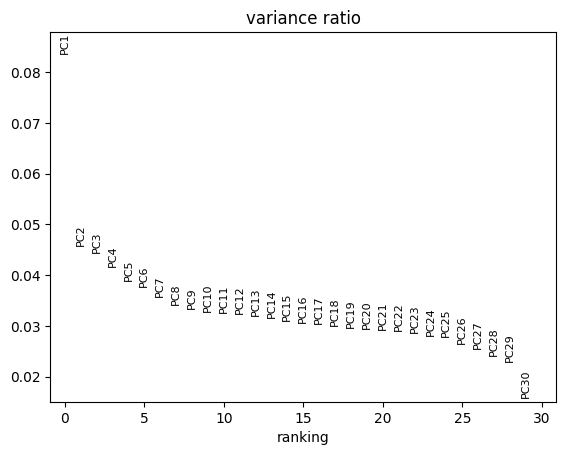

In [263]:
adata = adata_meta.copy()
# preprocess of UMAP
adata = preprocess_of_UMAP(adata)

# compute pca
sc.tl.pca(adata)
sc.pl.pca_variance_ratio(adata, log=False)

In [95]:
# Run UMAP                                                                                   
sc.pp.neighbors(adata, n_neighbors=50, n_pcs=20)
sc.tl.umap(adata)

# save position of each point
# save_pos_on_UMAP(adata, out_dir=f"{out_path}{FOI}_UMAP_pos_of_cells.csv")

In [96]:
# Run Leiden cluster
sc.tl.leiden(adata, resolution=1)

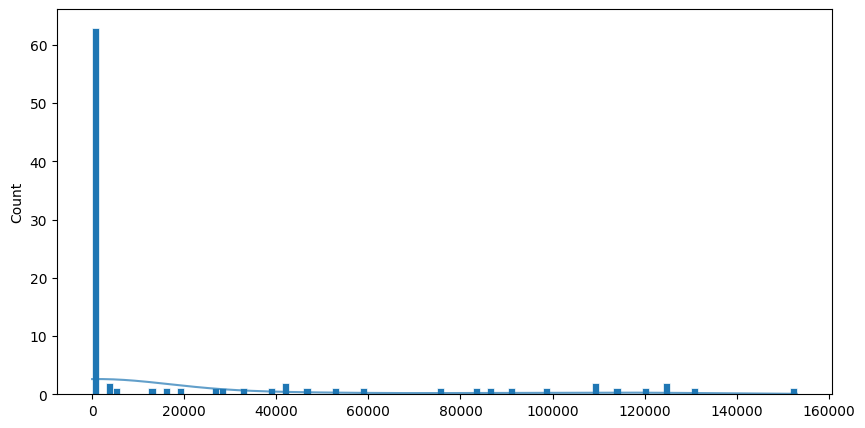

In [97]:
a=[len(adata[adata.obs.leiden == _]) for _ in adata.obs.leiden.unique()]
fig, ax = plt.subplots(figsize=(10,5))
sns.histplot(a, bins=100, stat='count', alpha=1, kde=True,
            edgecolor='white', linewidth=0.5,
            # log=True, 
            ax=ax,
            line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'),
            # binrange=[0,100]
            )
plt.show()
adata_temp = adata.copy()
adata = adata[adata.obs.leiden.isin([_ for _ in adata.obs.leiden.unique() if len(adata[adata.obs.leiden == _]) > len(adata)/200])]

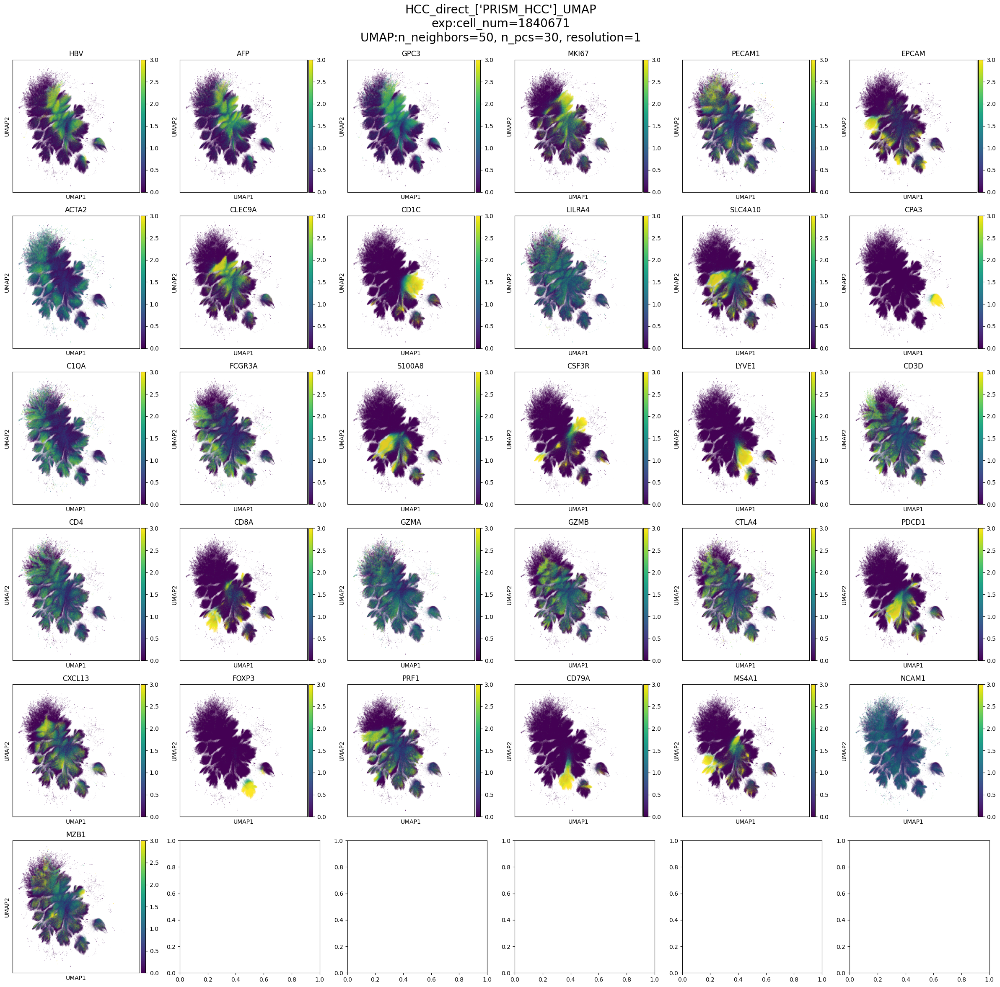

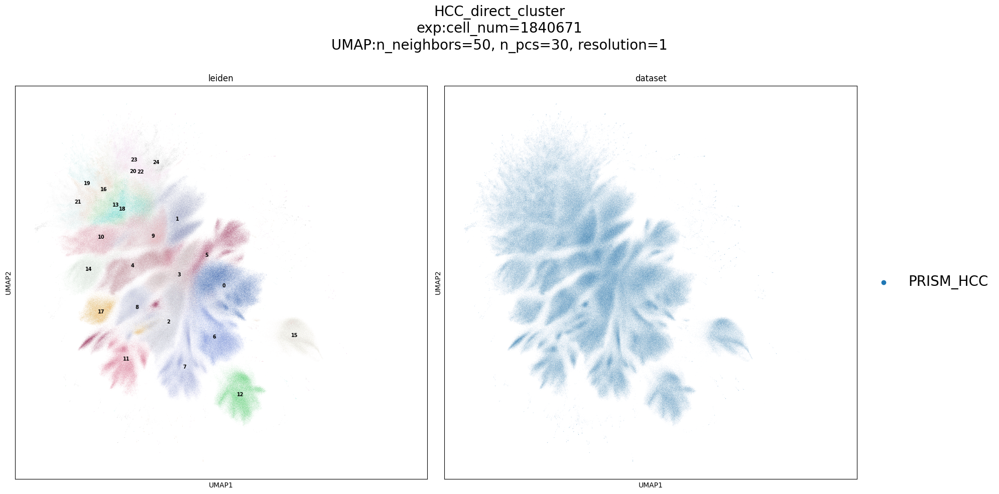

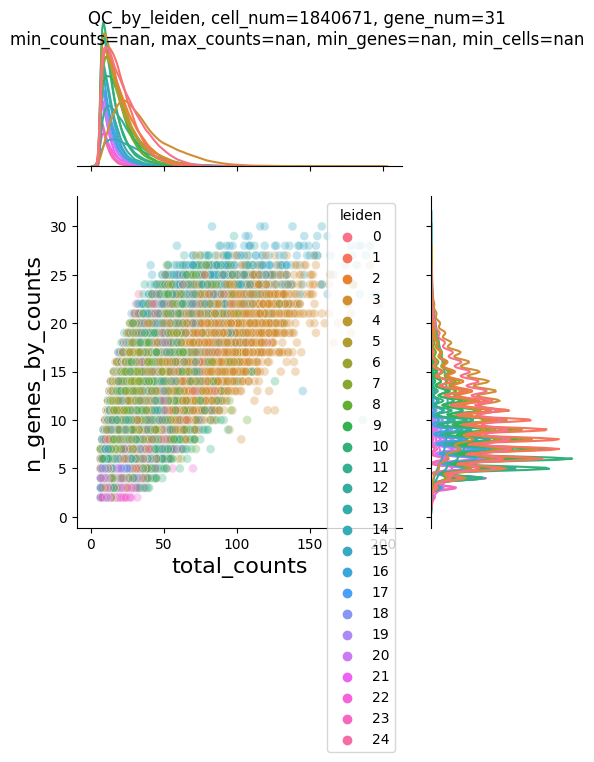

In [98]:
# Plot Gene distribution
UMAP_genes_plot(adata, FOI, save=True, out_path=out_path, datatype='direct', dataset=["PRISM_HCC"])
UMAP_leiden_plot(adata, FOI, color='leiden', save=True, out_path=out_path, datatype='direct')
QC_plot(adata, hue='leiden')
adata_temp.write(r'E:\TMC\cell_typing\results\cluster\2023.9.19_20_layers_min_counts=7, max_counts=200, min_genes=2\adata_temp.h5ad')
adata.write(r'E:\TMC\cell_typing\results\cluster\2023.9.19_20_layers_min_counts=7, max_counts=200, min_genes=2\adata.h5ad')

# Integration with scRNA-seq using Harmony


## load and preprocess of sc data


### load sc data1


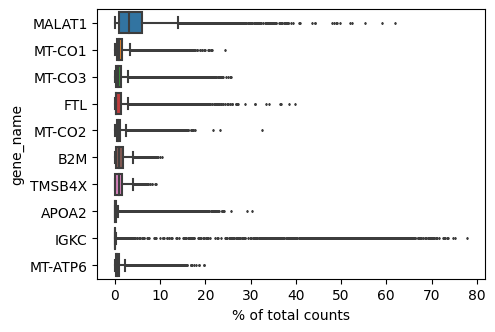

maxima: [2718.7200000000003, 81824.08, 102641.28, 117213.32, 123458.48, 138030.52000000002, 152602.56, 158847.72, 169256.32, 179664.91999999998, 192155.24000000002, 202563.84, 221299.32, 233789.64, 244198.24, 250443.4, 258770.28, 267097.16000000003, 277505.76, 289996.07999999996, 296241.24, 306649.83999999997, 317058.44, 329548.76, 337875.64, 369101.44, 379510.04000000004, 389918.64]


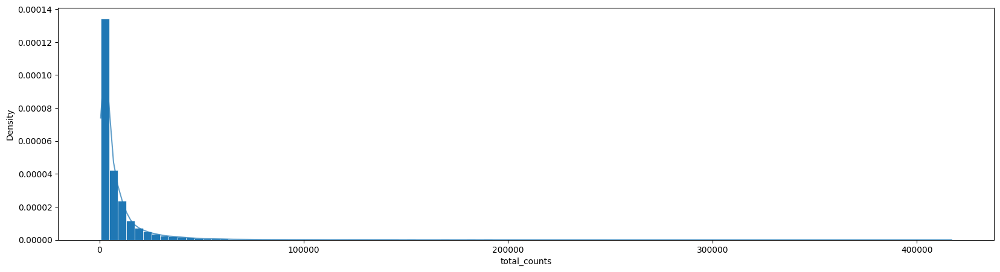

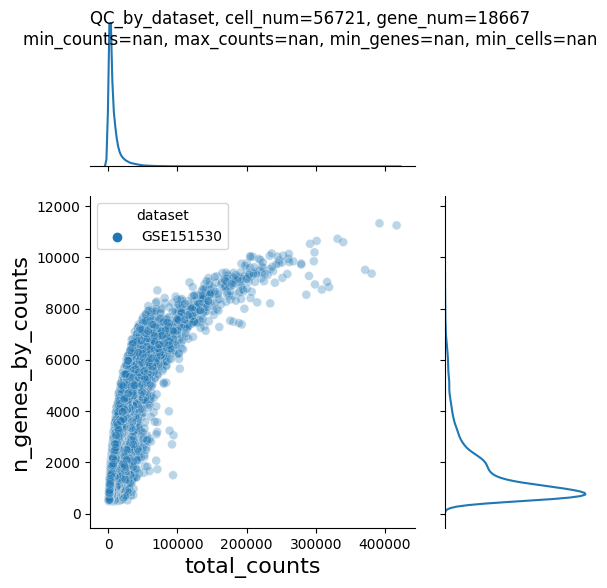

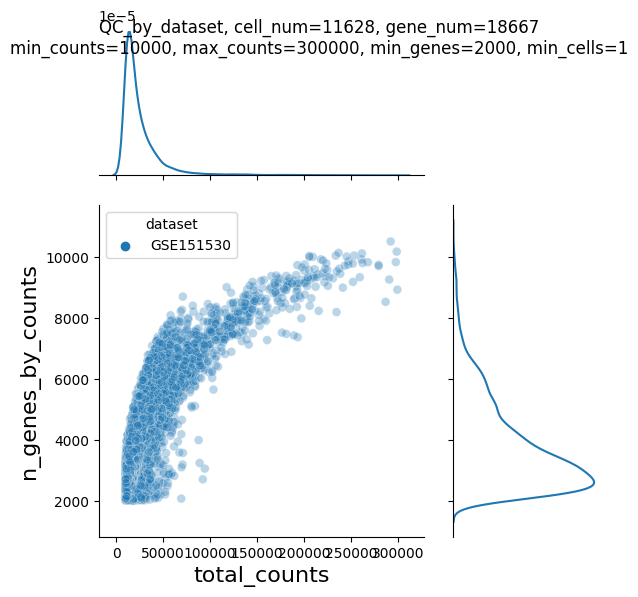

In [171]:
time_list['st_load_sc_data'] = time.time()
# path
sc_path = "./sc_data/sc_data_HCC/"
file = "processed_GSE151530_better"

# load sc-rna data
adata_sc1_meta = sc.read_mtx(os.path.join(sc_path, file, "matrix.mtx"))
adata_sc1_meta = adata_sc1_meta.T

adata_temp_features = pd.read_csv(os.path.join(sc_path, file, "genes.tsv"), sep="\t", header=None)
adata_sc1_meta.var["gene_name"] = adata_temp_features[1].tolist()
adata_sc1_meta.var.set_index("gene_name", inplace=True)
adata_sc1_meta.var_names_make_unique()

info = pd.read_csv(os.path.join(sc_path,file,'Info.txt'), sep='\t')
adata_sc1_meta.obs['sample'] = list(info['Sample'])
adata_sc1_meta.obs['type'] = list(info['Type'])
adata_sc1_meta.obs['dataset'] = ['GSE151530'] * len(adata_sc1_meta)

# general process
adata_sc1 = adata_sc1_meta.copy()
adata_sc1, _, _ = general_preprocess(adata=adata_sc1, min_genes=2000, min_counts=10000, max_counts=300000, min_cells=1,)

### load sc data2


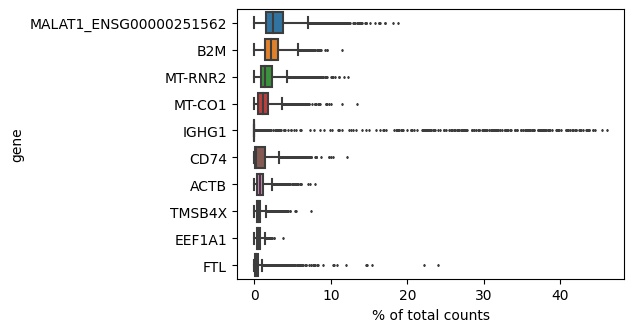

maxima: [347254.34395000007, 1183846.8380500001, 1348630.2081, 1488062.29045, 1678196.9482, 2235925.2776]


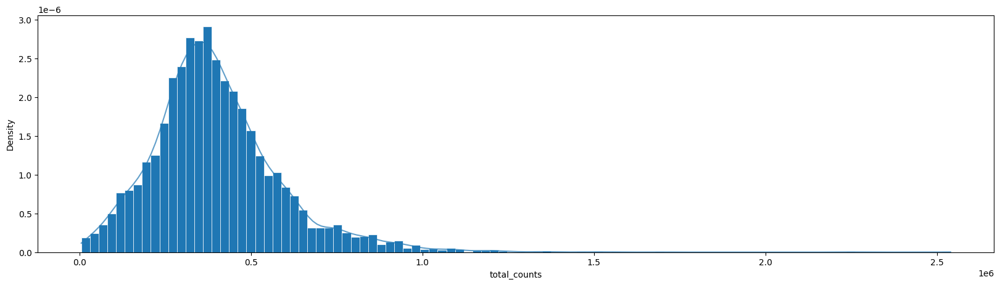

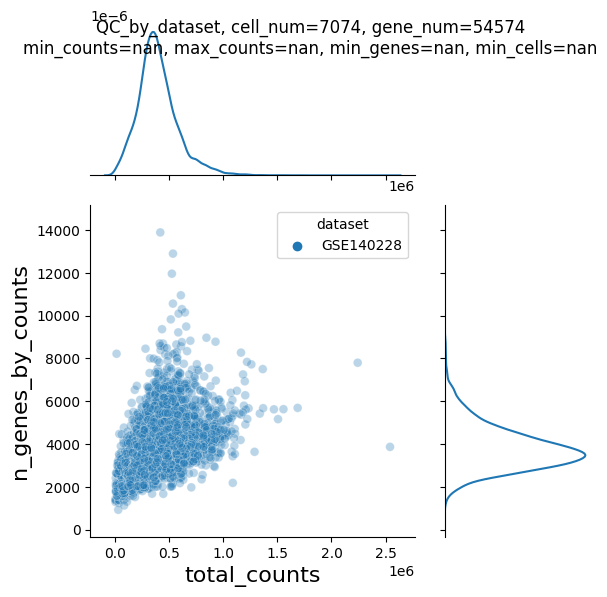

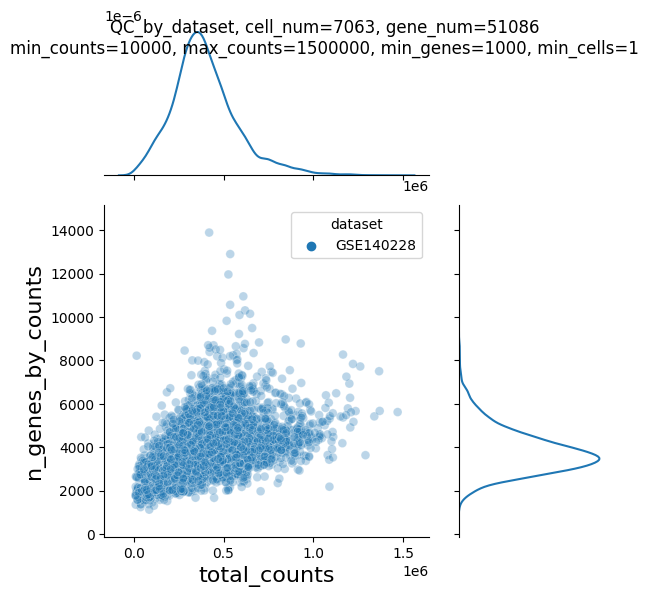

In [172]:
# load sc-rna data GSE140228
sc_path = "./sc_data/sc_data_HCC/"
file = "processed_GSE140228_immune"

adata_sc2_meta = pd.read_csv(os.path.join(sc_path, file, "GSE140228_read_counts_Smartseq2.csv"), index_col=0)
adata_sc2_meta = sc.AnnData(adata_sc2_meta.T)
adata_sc2_meta.var_names_make_unique()

info = pd.read_csv(os.path.join(sc_path, file, "GSE140228_cell_info_Smartseq2.tsv"), sep="\t")
adata_sc2_meta.obs["type"] = info["celltype_sub"].tolist()
adata_sc2_meta.obs["sample"] = info["Sample"].tolist()
adata_sc2_meta.obs["tissue"] = info["Tissue"].tolist()
adata_sc2_meta.obs['dataset'] = ['GSE140228'] * len(adata_sc2_meta)

# general process
adata_sc2 = adata_sc2_meta.copy()
adata_sc2, _, _ = general_preprocess(adata=adata_sc2, min_genes=1000, min_counts=10000, max_counts=1500000, min_cells=1,)

### load sc data3


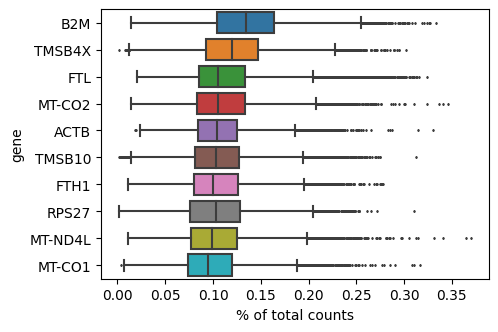

maxima: [6848.6271035]


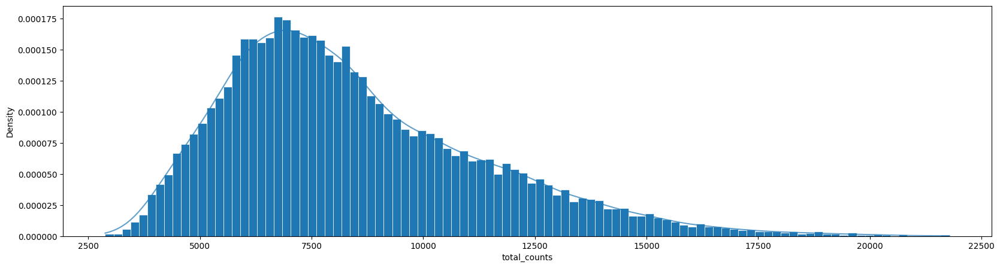

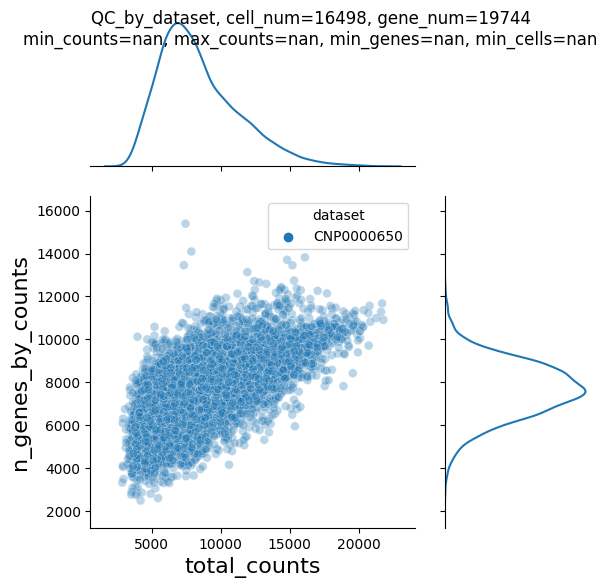

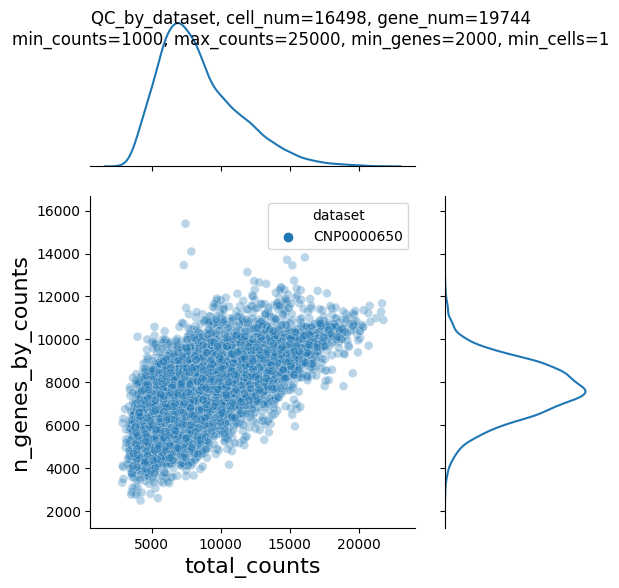

In [173]:
sc_data_meta = pd.read_csv('.\sc_data\sc_data_HCC\processed_CNP0000650_CD45-\HCC_log_tpm_expression_matrix.txt',sep='\t',index_col=0)
adata_sc3_meta = sc.AnnData(sc_data_meta.T)
adata_sc3_meta.var_names_make_unique()

info = pd.read_csv('.\sc_data\sc_data_HCC\processed_CNP0000650_CD45-\HCC_cell_metadata.txt',sep='\t')
adata_sc3_meta.obs['sample']=info['sample_name']
adata_sc3_meta.obs['type']=info['cell_type']
adata_sc3_meta.obs['tissue']=info['tissue_source']
adata_sc3_meta.obs['dataset']=['CNP0000650']*len(adata_sc3_meta)

# general process
adata_sc3 = adata_sc3_meta.copy()
adata_sc3, _, _ = general_preprocess(adata=adata_sc3, min_genes=2000, min_counts=1000, max_counts=25000, min_cells=1,)

## harmony combine


In [175]:
time_list['st_harmony'] = time.time()
adata.var.index = adata.var.index.str.upper()
adata_sc1.var.index = adata_sc1.var.index.str.upper()
adata_sc1.var_names_make_unique()
adata_sc2.var.index = adata_sc2.var.index.str.upper()
adata_sc2.var_names_make_unique()
adata_sc3.var.index = adata_sc3.var.index.str.upper()
adata_sc3.var_names_make_unique()

list_of_variable_names = gene_list[1:]
adata_subset = adata[:, list_of_variable_names]
adata_subset.var.index = adata_subset.var.index.str.upper()

In [176]:
adata_sc1_subset = adata_sc1.copy()
# adata_sc_subset = adata_sc[:, list_of_variable_names]
# Normalization scaling sc
sc.pp.normalize_total(adata_sc1_subset)
sc.pp.log1p(adata_sc1_subset)
# Calculate QC metrics
sc.pp.calculate_qc_metrics(adata_sc1_subset, percent_top=None, inplace=True)
# Scale data to unit variance and zero mean
sc.pp.regress_out(adata_sc1_subset, ["total_counts"])
sc.pp.scale(adata_sc1_subset)

In [ ]:
adata_sc2_subset = adata_sc2.copy()
# adata_sc2_subset = adata_sc2[adata_sc2[:,'CPA3'].X > 0][:, list_of_variable_names]
# adata_sc2_subset = adata_sc2[:, list_of_variable_names]
# Normalization scaling sc
sc.pp.normalize_total(adata_sc2_subset)
sc.pp.log1p(adata_sc2_subset)
# Calculate QC metrics
sc.pp.calculate_qc_metrics(adata_sc2_subset, percent_top=None, inplace=True)
# Scale data to unit variance and zero mean
sc.pp.regress_out(adata_sc2_subset, ["total_counts"])
sc.pp.scale(adata_sc2_subset)

In [ ]:
adata_sc3_subset = adata_sc3.copy()
# adata_sc2_subset = adata_sc2[adata_sc2[:,'CPA3'].X > 0][:, list_of_variable_names]
# adata_sc2_subset = adata_sc2[:, list_of_variable_names]
# Normalization scaling sc
sc.pp.normalize_total(adata_sc3_subset)
sc.pp.log1p(adata_sc3_subset)
# Calculate QC metrics
sc.pp.calculate_qc_metrics(adata_sc3_subset, percent_top=None, inplace=True)
# Scale data to unit variance and zero mean
sc.pp.regress_out(adata_sc3_subset, ["total_counts"])
sc.pp.scale(adata_sc3_subset)

In [106]:
combine_adata = adata_subset.concatenate(adata_sc1_subset, adata_sc2_subset, adata_sc3_subset, batch_key="dataset", batch_categories=["PRISM_HCC", "GSE151530", "GSE140228", "CNP0000650"])
# combine_adata = adata_subset.concatenate(adata_sc1_subset, batch_key="dataset", batch_categories=["st", "scrna1"])
# sc.pp.combat(combine_adata, key="dataset")

print("origin_gene:", adata.var.index)
print("origin_gene_num:", len(adata.var.index))
print("combine_gene:", combine_adata.var.index)
print("combine_gene_num:", len(combine_adata.var.index))
print("Genes_not_matched:", set(adata.var.index) - set(combine_adata.var.index))

origin_gene: Index(['HBV', 'AFP', 'GPC3', 'MKI67', 'PECAM1', 'EPCAM', 'ACTA2', 'CLEC9A',
       'CD1C', 'LILRA4', 'SLC4A10', 'CPA3', 'C1QA', 'FCGR3A', 'S100A8',
       'CSF3R', 'LYVE1', 'CD3D', 'CD4', 'CD8A', 'GZMA', 'GZMB', 'CTLA4',
       'PDCD1', 'CXCL13', 'FOXP3', 'PRF1', 'CD79A', 'MS4A1', 'NCAM1', 'MZB1'],
      dtype='object')
origin_gene_num: 31
combine_gene: Index(['AFP', 'GPC3', 'MKI67', 'PECAM1', 'EPCAM', 'ACTA2', 'CLEC9A', 'CD1C',
       'LILRA4', 'SLC4A10', 'CPA3', 'C1QA', 'FCGR3A', 'S100A8', 'CSF3R',
       'LYVE1', 'CD3D', 'CD4', 'CD8A', 'GZMA', 'GZMB', 'CTLA4', 'PDCD1',
       'CXCL13', 'FOXP3', 'PRF1', 'CD79A', 'MS4A1', 'NCAM1', 'MZB1'],
      dtype='object')
combine_gene_num: 30
Genes_not_matched: {'HBV'}


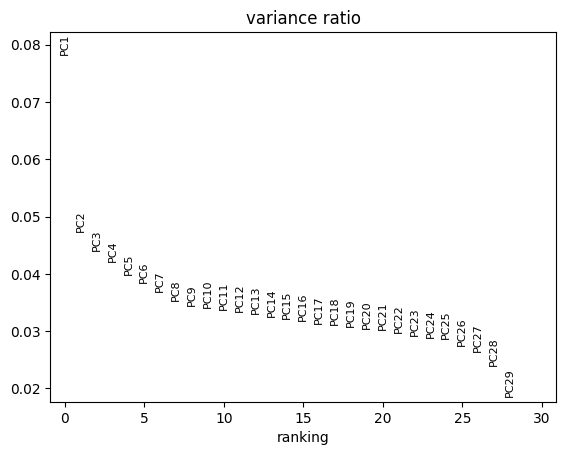

AnnData object with n_obs × n_vars = 1875860 × 30
    obs: 'dataset', 'layer', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'type', 'leiden', 'sample', 'tissue'
    var: 'n_cells_by_counts-CNP0000650', 'mean_counts-CNP0000650', 'log1p_mean_counts-CNP0000650', 'pct_dropout_by_counts-CNP0000650', 'total_counts-CNP0000650', 'log1p_total_counts-CNP0000650', 'n_cells-CNP0000650', 'mean-CNP0000650', 'std-CNP0000650', 'n_cells_by_counts-GSE140228', 'mean_counts-GSE140228', 'log1p_mean_counts-GSE140228', 'pct_dropout_by_counts-GSE140228', 'total_counts-GSE140228', 'log1p_total_counts-GSE140228', 'n_cells-GSE140228', 'mean-GSE140228', 'std-GSE140228', 'n_cells_by_counts-GSE151530', 'mean_counts-GSE151530', 'log1p_mean_counts-GSE151530', 'pct_dropout_by_counts-GSE151530', 'total_counts-GSE151530', 'log1p_total_counts-GSE151530', 'n_cells-GSE151530', 'mean-GSE151530', 'std-GSE151530', 'n_cells_by_counts-PRISM_HCC', 'mean_counts-PRISM

In [107]:
sc.tl.pca(combine_adata, n_comps=29)
sc.pl.pca_variance_ratio(combine_adata, log=False)

h_pcs = 29
sc.tl.pca(combine_adata, n_comps=h_pcs)
sc_cell_num = len(combine_adata) - len(adata)
print(combine_adata)

In [108]:
import scanpy.external as sce

sce.pp.harmony_integrate(
    combine_adata,
    "dataset",
    "X_pca",
    "X_pca_harmony",
    max_iter_harmony=30,
    # max_iter_kmeans=30,
)

2023-09-19 18:22:33,231 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-09-19 18:29:30,970 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-09-19 18:29:38,547 - harmonypy - INFO - Iteration 1 of 30
2023-09-19 18:55:06,693 - harmonypy - INFO - Iteration 2 of 30
2023-09-19 19:20:36,793 - harmonypy - INFO - Iteration 3 of 30
2023-09-19 19:45:38,078 - harmonypy - INFO - Iteration 4 of 30
2023-09-19 20:10:42,340 - harmonypy - INFO - Iteration 5 of 30
2023-09-19 20:35:46,793 - harmonypy - INFO - Iteration 6 of 30
2023-09-19 21:00:46,266 - harmonypy - INFO - Iteration 7 of 30
2023-09-19 21:25:51,265 - harmonypy - INFO - Iteration 8 of 30
2023-09-19 21:51:16,171 - harmonypy - INFO - Converged after 8 iterations


## umap and leiden


In [110]:
time_list['st_umap_of_harmony'] = time.time()
neighbor = 50
sc.pp.neighbors(combine_adata, n_neighbors=neighbor, use_rep="X_pca_harmony")
sc.tl.umap(combine_adata)

In [ ]:
leiden_resolution=1
sc.tl.leiden(combine_adata, resolution=leiden_resolution)

a=[len(combine_adata[combine_adata.obs.leiden == _]) for _ in combine_adata.obs.leiden.unique()]
fig, ax = plt.subplots(figsize=(10,5))
sns.histplot(a, bins=100, stat='count', alpha=1, kde=True,
            edgecolor='white', linewidth=0.5,
            # log=True, 
            ax=ax,
            line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'),
            # binrange=[0,100]
            )
plt.show()

combine_adata = combine_adata[combine_adata.obs.leiden.isin([_ for _ in combine_adata.obs.leiden.unique() if len(combine_adata[combine_adata.obs.leiden == _]) > len(combine_adata)/200])]
a=[len(combine_adata[combine_adata.obs.leiden == _]) for _ in combine_adata.obs.leiden.unique()]
fig, ax = plt.subplots(figsize=(10,5))
sns.histplot(a, bins=100, stat='count', alpha=1, kde=True,
            edgecolor='white', linewidth=0.5,
            # log=True, 
            ax=ax,
            line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'),
            # binrange=[0,100]
            )
plt.show()

UMAP_genes_plot(combine_adata, FOI, save=True, out_path=out_path, datatype='harmony', dataset=['PRISM_HCC'])
UMAP_leiden_plot(combine_adata, FOI, color='leiden', save=True, out_path=out_path, datatype='harmony')

In [ ]:
leiden_resolution=5
sc.tl.leiden(combine_adata, resolution=leiden_resolution)

a=[len(combine_adata[combine_adata.obs.leiden == _]) for _ in combine_adata.obs.leiden.unique()]
fig, ax = plt.subplots(figsize=(10,5))
sns.histplot(a, bins=100, stat='count', alpha=1, kde=True,
            edgecolor='white', linewidth=0.5,
            # log=True, 
            ax=ax,
            line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'),
            # binrange=[0,100]
            )
plt.show()

combine_adata = combine_adata[combine_adata.obs.leiden.isin([_ for _ in combine_adata.obs.leiden.unique() if len(combine_adata[combine_adata.obs.leiden == _]) > 3000])]
a=[len(combine_adata[combine_adata.obs.leiden == _]) for _ in combine_adata.obs.leiden.unique()]
fig, ax = plt.subplots(figsize=(10,5))
sns.histplot(a, bins=100, stat='count', alpha=1, kde=True,
            edgecolor='white', linewidth=0.5,
            # log=True, 
            ax=ax,
            line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'),
            # binrange=[0,100]
            )
plt.show()

UMAP_genes_plot(combine_adata, FOI, save=True, out_path=out_path, datatype='harmony', dataset=['PRISM_HCC'])
UMAP_leiden_plot(combine_adata, FOI, color='leiden', save=True, out_path=out_path, datatype='harmony')

In [158]:
point_start = time_list['st_load_data']
for time_point in time_list.keys():
    time_list[time_point] -= point_start

In [ ]:
# combine_adata = sc.read_h5ad(r'E:\TMC\cell_typing\results\cluster\2023.8.29_HCC_all\GSE151530\HCC_GSE_harmony.h5ad')
# combine_adata = sc.read_h5ad(r'E:\TMC\cell_typing\results\cluster\2023.9.6_harmony-cluster_and_thre-in-cluster\without_CLEC9A, MS4A1\harmony_GSE151530_without_CLEC9A, MS4A1.h5ad')
# combine_adata = sc.read_h5ad(r'E:\TMC\cell_typing\results/cluster/2023.9.6_harmony-cluster_and_thre-in-cluster/without_CLEC9A, MS4A1/harmony_GSE151530&GSE140228_without_CLEC9A, MS4A1.h5ad')
# combine_adata = sc.read_h5ad(r'E:\TMC\cell_typing\results\cluster\2023.9.6_harmony-cluster_and_thre-in-cluster\without_CLEC9A, MS4A1, CPA3\combine_adata.h5ad')
# combine_adata = sc.read_h5ad(r'E:\TMC\cell_typing\results\cluster\2023.9.7_HCC_harmony_loose_filter\sc_GSE151530_30genes\combine_adata_with_GSE151530_30genes.h5ad')
# combine_adata = sc.read_h5ad(r'E:\TMC\cell_typing\results\cluster\2023.9.7_HCC_harmony_loose_filter\sc_GSE151530&GSE140228&CNP0000650_30genes\combine_adata_with_GSE151530&GSE140228&CNP0000650_30genes.h5ad')
# combine_adata = sc.read_h5ad(r'E:\TMC\cell_typing\results\cluster\2023.9.10\combine_adata_with_GSE151530&GSE140228&CNP0000650_30genes_res=5.5.h5ad')
# combine_adata = sc.read_h5ad(r'E:\TMC\cell_typing\results\cluster\2023.9.12\combine_adata_with_GSE151530&GSE140228&CNP0000650_30genes.h5ad')
# combine_adata = sc.read_h5ad(r'E:\TMC\cell_typing\results\cluster\2023.9.12\combine_adata_with_GSE151530&GSE140228&CNP0000650_30genes, res=5.5.h5ad')
# combine_adata = sc.read_h5ad(r'E:\TMC\cell_typing\results\cluster\2023.9.13\combine_adata_res=5.5, filtered, typed.h5ad')

# Threshold for interested cluster


### functions to threshold in cluster

In [ ]:
def threshold_in_cluster(adata, marker_gene=[], thre_gene=['AFP','GPC3','ACTA2','PECAM1'], type_name=[], cluster_dict={}):
# for cluster_gene in cluster_to_filter:
    thre_min = [True] * len(marker_gene) + [False] * len(thre_gene)
    gene_list = marker_gene + thre_gene
    minima_dict = {}
    for _ in gene_list:
        minima_dict[_] = ''

    cluster_list_temp=[]
    for _ in cluster_dict.keys():
        for name in type_name:
            if name in _:
                cluster_list_temp += [str(_) for _ in cluster_dict[_]]

    cluster = adata[adata.obs.leiden.isin(cluster_list_temp)]

    fig, ax = plt.subplots(nrows=1,ncols=len(thre_min),figsize=(24, 4))
    for i, gene in enumerate(gene_list):
        a = [float(_) for _ in cluster[:, gene].X]
        sns.histplot(a, bins=20, stat='density', alpha= 1, kde=True,
                    edgecolor='white', linewidth=0.5,
                    log=True, 
                    ax=ax[i],
                    line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'))
        ax[i].get_lines()[0].set_color('red') # edit line color due to bug in sns v 0.11.0
        ax[i].set_xlabel(gene)

        y = ax[i].get_lines()[0].get_ydata()
        minima_dict[gene] = [float(_/len(y)*(max(a)-min(a))+min(a)) for _ in argrelextrema(np.array(y), np.less)[0]]
        # print(f'{gene}_minima: {minima_dict[gene]}')
        fig.subplots_adjust(hspace=0.4)
        fig.subplots_adjust(wspace=0.4)
        fig.suptitle(f'distribution of cluster, marker gene={marker_gene}')
    plt.show()

    cluster.obs['tmp_leiden'] = ['-1']*len(cluster)
    for _, gene in enumerate(gene_list):
        minima = minima_dict[gene]
        while True:
            if len(minima) == 0:
                minima = [0]
                break
            if minima[0] > 1 and gene != 'CPA3':
                minima[0] = 0
                break
            if minima[0] < -1 and gene != 'CPA3':
                minima.pop(0)
                continue
            break
        
        print(f'{gene}_thre: {minima[0]}')

        if thre_min[_]:
            tmp = cluster[cluster[:, gene].X > minima[0]]
            cluster.obs['tmp_leiden'][tmp.obs.index] = ['1']*len(tmp)
        else:
            tmp = cluster[cluster[:, gene].X > minima[0]]
            cluster.obs['tmp_leiden'][tmp.obs.index] = ['-1']*len(tmp)
    
    tmp = cluster[cluster.obs['tmp_leiden']=='-1']
    adata.obs['tmp_leiden'][tmp.obs.index] = ['-2']*len(tmp)

    cell_to_plot = len(cluster[cluster.obs['tmp_leiden']=='1'])
    print(f'marker_gene={marker_gene}, {cell_to_plot} cells of {len(cluster)} cells left\n')
    return adata


def collect_liver(combine_adata_st, tissue_obs='tissue', in_out_leiden='tmp_leiden'):
    other_cluster = combine_adata_st[combine_adata_st.obs[in_out_leiden]=='-2']
    liver = other_cluster[other_cluster.obs[tissue_obs] == "liver"]
    combine_adata_st.obs[in_out_leiden] = list(combine_adata_st.obs[in_out_leiden])
    combine_adata_st.obs[in_out_leiden][liver.obs.index] = ["-1"] * len(liver)
    return combine_adata_st


def re_num_leiden(combine_adata_st, cluster_dict, in_leiden='tmp_leiden', out_leiden='new_leiden', out_type='type'):
    combine_adata_st.obs[out_leiden] = ["-2"] * len(combine_adata_st)
    combine_adata_st.obs[out_type] = ["other"] * len(combine_adata_st)
    for cluster_num, cluster_name in enumerate(cluster_dict.keys()):
        for sub_cluster in cluster_dict[cluster_name]:
            temp = combine_adata_st[combine_adata_st.obs[in_leiden] == str(sub_cluster)]
            combine_adata_st.obs[out_leiden][temp.obs.index] = [str(cluster_num)] * len(temp)
            combine_adata_st.obs[out_type][temp.obs.index] = [str(cluster_name)] * len(temp)
    temp = combine_adata_st[combine_adata_st.obs[out_leiden] == '-2']
    combine_adata_st.obs[out_type][temp.obs.index] = ['other'] * len(temp)
    return combine_adata_st

## annotate interested clusters

In [17]:
# adata = sc.read_h5ad(r'E:\TMC\cell_typing\results\2023.9.19-9.22_PRISM_HCC_20_layers_min_counts=7, max_counts=200, min_genes=2\direct\adata.h5ad')
# combine_adata_st = sc.read_h5ad(r'E:\TMC\cell_typing\results\2023.9.19-9.22_PRISM_HCC_20_layers_min_counts=7, max_counts=200, min_genes=2\harmony\s7b_combine_adata_st_relayered.h5ad')

In [37]:
cluster_dict = {
    "Liver_normal":[-1],

    "Tumor_AFP+":[12,18,47,48,52],
    "Tumor_GPC3+":[15,59],
    "Tumor_proliferation":[77,58,11,31,73,51,40,44,69],
    "Endo_PECAM1+":[26,53],
    "Ep_EPCAM+":[9,33,56],
    "CAF_ACTA2+":[19,54],

    "cDC1_CLEC9A+":[1,30,34,42,67,87],
    "cDC2_CD1C+":[8,14,72,75,85,88],
    "pDC_LILRA4+":[13,29],
    
    "Mait_SLC4A10+":[6,28,55,60],
    "Mast_CPA3+":[10],
    "Monocyte_CD14+":[4],
    "Monocyte_CD14+, CD16+":[17,85],
    "Monocyte_CD16+":[71,24,62,66],
    "Neutrophil_CSF3R+, S100A8+":[45],
    "Neutrophil_CSF3R+":[20,27,46,68,89],
    "Macrophage_LYVE1+":[5,32,81,86,91],

    "T_CD4+_other":[41,78],
    "T_CD4+, PD1+":[7],
    "T_CD4+, CXCL13+":[36,39,49,74],
    "T_CD4+, PD1+, CTLA4+":[22],
    "T_CD4+, PD1+, CXCL13+":[0,96],
    "Cyto_T_CD4+":[16,63,76],
    "T_CD8+_other":[37,43,50],
    "T_CD4+, CTLA4+":[25,84],
    "T_CD8+, PD1+":[35],
    "T_CD8+, GZMA+, CXCL13+":[83],
    # "Cyto_T_CD8+":[40,41,45],
    "T_reg":[3,61],
    "T_proliferation":[79],
    "B_CD79A+": [21,64,38,57],
    "B_MS4A1+": [2],
    # "B_CD79A+, MS4A1+": [61],

    "NK_NCAM1+":[23,70],

    # "others_or_ILCs_MZB1+":[10,24,86,71,85],
    # "others":[-2],
}

cluster_rough_dict = {
    "Liver": [],
    "Tumor": [],
    # "Tumor_AFP+": [],
    # "Tumor_GPC3+": [],
    # "Tumor_proliferation": [],
    "Endo": [],
    "Ep": [],
    "CAF": [],
    "DC": [],
    "Mait": [],
    "Mast": [],
    "Monocyte": [],
    "Neutrophil": [],
    "Macrophage": [],
    "CD4+": [],
    "CD8+": [],
    "T_reg": [],
    "T_proliferation": [],
    "B": [],
    "NK": [],
    #   'MZB1+':[],
}
for rough_type in cluster_rough_dict.keys():
    for fine_type in cluster_dict.keys():
        if rough_type in fine_type:
            cluster_rough_dict[rough_type] += cluster_dict[fine_type]

## plot gene distribution of each cluster

In [ ]:
# unknown_cluster = [str(_) for _ in sorted([21,38,57,94,64,2,
#                    62,66,24,95,92,90,71,84,93,41,78,26,82,25,53,63,54,76,16,19])]

# fig, ax = plt.subplots(ncols=1, nrows=len(unknown_cluster),figsize =(30, 150))
# for _ in range(len(unknown_cluster)):
#     cluster_num = unknown_cluster[_]
#     data = combine_adata_st[combine_adata_st.obs['tmp_leiden'] == cluster_num].X
#     ax[_].boxplot(data,
#                   flierprops={'marker': 'o', 'markersize': 2, 'markerfacecolor': 'fuchsia'})
#     ax[_].set_xticklabels(list(combine_adata_st.var_names))
#     ax[_].set_title(f'cluster{cluster_num}')
#     # show plot
# plt.show()

## threshold by marker genes

In [ ]:
# initialization of combine_adata_st and cluster_to_plot
combine_adata_st = combine_adata[combine_adata.obs.dataset == 'PRISM_HCC']
combine_adata_st.obs['tmp_leiden'] = list(combine_adata_st.obs['leiden'])
sub = [_.replace('-PRISM_HCC','') for _ in combine_adata_st.obs.index]

combine_adata_st.obs["type"] = list(adata.obs.loc[sub]["type"])

# threshold for marker gene clusters
combine_adata_st = threshold_in_cluster(combine_adata_st, marker_gene=['AFP', 'GPC3'], thre_gene=[], type_name=['Tumor'], cluster_dict=cluster_dict)
cluster_to_filter = ['CPA3', 'LYVE1', 'SLC4A10', 'CLEC9A', 'CD1C', 
                    #  'MZB1', 'CXCL13',
                     ]

for marker_gene in cluster_to_filter:
    combine_adata_st = threshold_in_cluster(combine_adata_st, [marker_gene], thre_gene=['AFP','GPC3','ACTA2','PECAM1'], type_name=[marker_gene], cluster_dict=cluster_dict)

# collect liver cells
combine_adata_st = collect_liver(combine_adata_st, tissue_obs='type', in_out_leiden='tmp_leiden')

# rename leidens based on cluster_dict
combine_adata_st = re_num_leiden(combine_adata_st, cluster_dict, in_leiden='tmp_leiden', out_leiden='leiden_subtype', out_type='subtype')
combine_adata_st = re_num_leiden(combine_adata_st, cluster_rough_dict, in_leiden='tmp_leiden', out_leiden='leiden_type', out_type='type')

## Num of filtered cluster composition of each layer

In [ ]:
from collections import Counter
before_filter = Counter(list(combine_adata_st.obs['layer']))
after_filter = Counter(list(combine_adata_st[combine_adata_st.obs['tmp_leiden']!='-2'].obs['layer']))

data = before_filter
courses = list(data.keys())
values = list(data.values())
fig = plt.figure(figsize = (15, 3))
# creating the bar plot
plt.bar(courses, values, 
        # color ='maroon',
        )

data = after_filter
courses = list(data.keys())
values = list(data.values())
fig = plt.figure(figsize = (15, 3))
# creating the bar plot
plt.bar(courses, values, 
        # color ='maroon',
        )

courses = list(data.keys())
values = [list(after_filter.values())[_]/list(before_filter.values())[_] for _ in range(len(list(after_filter.values())))]
fig = plt.figure(figsize = (15, 3))
# creating the bar plot
plt.bar(courses, values, 
        # color ='maroon',
        )

# cell typing results

## dotplot for type and subtype

In [10]:
adata_st_reordered = sc.read_h5ad(r'e:\TMC\cell_typing\results\2023.9.28-_PRISM_HCC_3D_fake\adata_PRISM_HCC_3D_fake_st_category_reordered.h5ad')
adata_raw_reordered = sc.read_h5ad(r'e:\TMC\cell_typing\results\2023.9.28-_PRISM_HCC_3D_fake\adata_PRISM_HCC_3D_fake_raw_category_reordered.h5ad')

adata_tmp = adata_raw_reordered.copy()
adata_tmp.obs = adata_st_reordered.obs.copy()
adata_tmp.raw = None  # remember that raw counts will be used to plot dotplots when it exists.

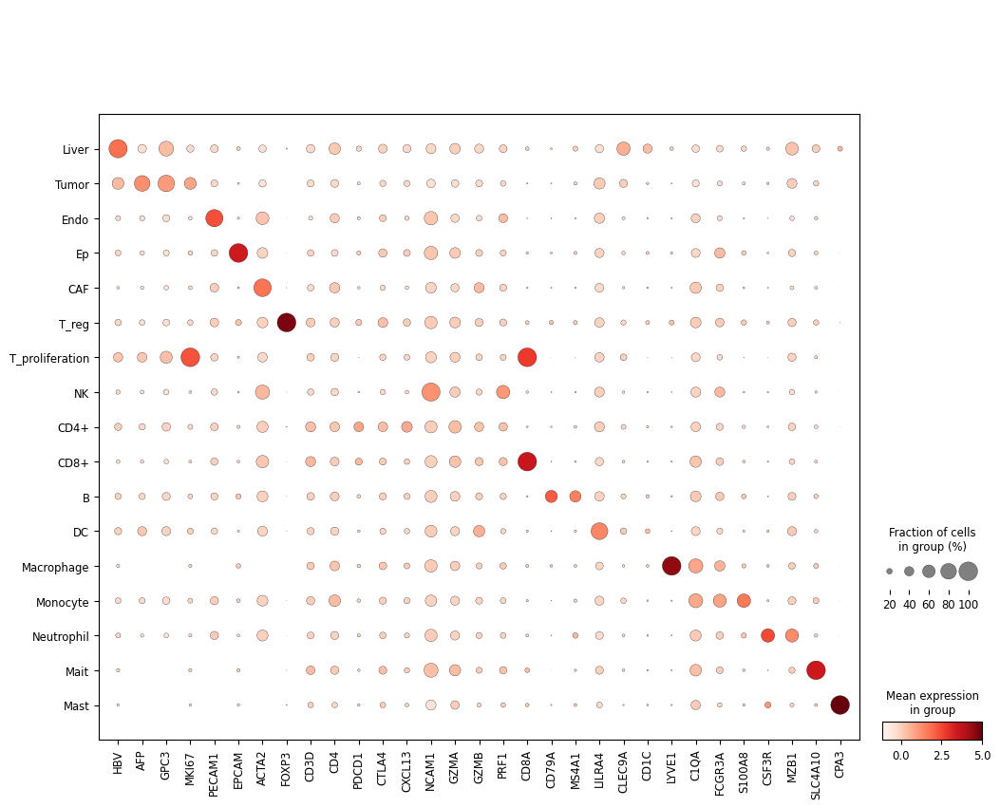

In [15]:
tmp_var_names=[
    'HBV',
    'AFP',
    'GPC3',
    'MKI67',
    'PECAM1',
    'EPCAM',
    'ACTA2',

    'FOXP3',
    
    'CD3D',
    'CD4',
    'PDCD1',
    'CTLA4',
    'CXCL13',
    'NCAM1',
    'GZMA',
    'GZMB',
    'PRF1',
    'CD8A',

    'CD79A',
    'MS4A1',
    
    'LILRA4',
    
    'CLEC9A',
    'CD1C',
    'LYVE1',
    
    'C1QA',
    'FCGR3A',
    'S100A8',
    'CSF3R',

    'MZB1',
    'SLC4A10',
    'CPA3',
    ]

tmp_category = [
    'Liver',
    'Tumor',
    'Endo',
    'Ep',
    'CAF',

    'T_reg',
    'T_proliferation',
    'NK',

    'CD4+',
    'CD8+',
    
    'B',
    
    'DC',
    
    'Macrophage',
    'Monocyte',
    'Neutrophil',
    
    'Mait',
    'Mast'
    ]

tmp = adata_tmp[adata_tmp.obs.type!='other']
tmp.obs.type = pd.Categorical(tmp.obs.type, categories=tmp_category)
                                                                                                                                                                                                
fig,ax = plt.subplots(figsize=(12,10))
sc.pl.dotplot(tmp, 
              var_names=tmp_var_names, 
              groupby='type', 
              vmax=5,
              ax=ax,
              show=False,
              )
plt.show()
# plt.savefig(r'e:\TMC\cell_typing\results\2023.9.28-_PRISM_HCC_3D_fake\figures\1_dotplot_type.pdf', bbox_inches = 'tight')
# plt.savefig(r'e:\TMC\cell_typing\results\2023.9.28-_PRISM_HCC_3D_fake\figures\1_dotplot_type.png', bbox_inches = 'tight'， dpi=300)

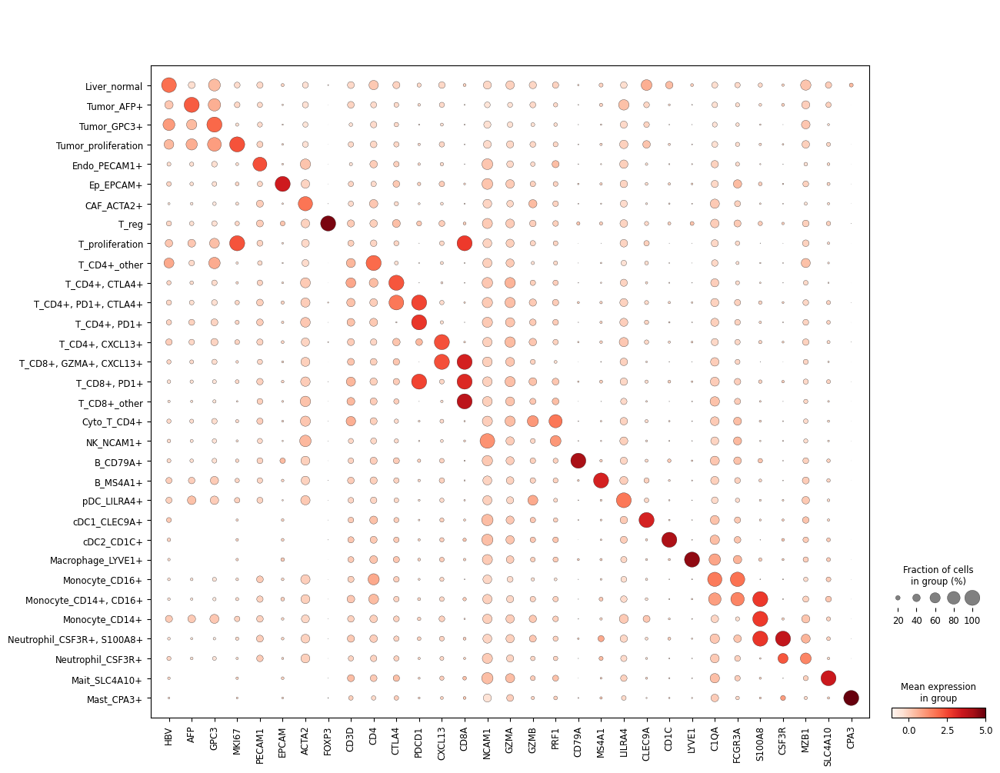

In [17]:
tmp_var_names=[
    'HBV',
    'AFP',
    'GPC3',
    'MKI67',
    'PECAM1',
    'EPCAM',
    'ACTA2',

    'FOXP3',
    
    'CD3D',
    'CD4',
    'CTLA4',
    'PDCD1',
    'CXCL13',
    
    'CD8A',
    'NCAM1',
    'GZMA',
    'GZMB',
    'PRF1',

    'CD79A',
    'MS4A1',
    
    'LILRA4',
    
    'CLEC9A',
    'CD1C',
    'LYVE1',
    
    'C1QA',
    'FCGR3A',
    'S100A8',
    'CSF3R',
    

    'MZB1',
    'SLC4A10',
    'CPA3',
    ]

tmp_category = [
    'Liver_normal',
    'Tumor_AFP+',
    'Tumor_GPC3+',
    'Tumor_proliferation',
    'Endo_PECAM1+',
    'Ep_EPCAM+',
    'CAF_ACTA2+',
    'T_reg',
    'T_proliferation',
    "T_CD4+_other",
    
    "T_CD4+, CTLA4+",
    "T_CD4+, PD1+, CTLA4+",
   
    "T_CD4+, PD1+",
    # "T_CD4+, PD1+, CXCL13+",
    "T_CD4+, CXCL13+",
    "T_CD8+, GZMA+, CXCL13+",
    "T_CD8+, PD1+",

    "T_CD8+_other",
    
    "Cyto_T_CD4+",
    'NK_NCAM1+',
    
    'B_CD79A+',
    # 'B_CD79A+, MS4A1+',
    'B_MS4A1+',
    
    'pDC_LILRA4+',
    'cDC1_CLEC9A+',
    'cDC2_CD1C+',
    
    'Macrophage_LYVE1+',
    # 'Macrophage_C1QA+',
    
    'Monocyte_CD16+',
    'Monocyte_CD14+, CD16+',
    'Monocyte_CD14+',

    'Neutrophil_CSF3R+, S100A8+',
    'Neutrophil_CSF3R+',
    
    'Mait_SLC4A10+',
    'Mast_CPA3+'
    ]

tmp = adata_tmp[adata_tmp.obs.subtype!='other']
tmp.obs.subtype = tmp.obs.subtype.replace("T_CD4+, PD1+, CXCL13+", "T_CD4+, CXCL13+")

tmp.obs.subtype = pd.Categorical(tmp.obs.subtype, categories=tmp_category)

fig,ax = plt.subplots(figsize=(14,12))
sc.pl.dotplot(tmp, 
              var_names=tmp_var_names, 
              groupby='subtype', 
              vmax=5,
              ax=ax,
              show=False,
              )
plt.show()
# plt.savefig(r'e:\TMC\cell_typing\results\2023.9.28-_PRISM_HCC_3D_fake\figures\1_dotplot_subtype.pdf', bbox_inches = 'tight')
# plt.savefig(r'e:\TMC\cell_typing\results\2023.9.28-_PRISM_HCC_3D_fake\figures\1_dotplot_subtype.png', bbox_inches = 'tight')

## umap colored by genes, cluster and dataset

In [38]:
type_colormap = {
    'Liver':(1,0.392,0),
    'Tumor':(0.751,0.491,0),
    'Endo':(1,0,1),
    'Ep':(0,1,0),
    'CAF':(0,0,1),
    'DC':(1,0.259,0),
    'Mait':(1,0,0.434),
    'Mast':(1,0,0),
    'Monocyte':(0,0.471,1),
    'Neutrophil':(1,1,0),
    'Macrophage':(0.7,1,0),
    'CD4+':(0.5,0.5,0.5),
    'CD8+':(1,0.8,0),
    'T_reg':(0,1,0.672),
    'T_proliferation':(0,1,0.636),
    'B':(0,1,1),
    'NK':(1,0,0),
    'other':(0.9,0.9,0.9),
}

subtype_colormap = dict()
for subtype in cluster_dict.keys():
    for rough_type in type_colormap.keys():
        if rough_type in subtype:
            subtype_colormap[subtype] = type_colormap[rough_type]
            break

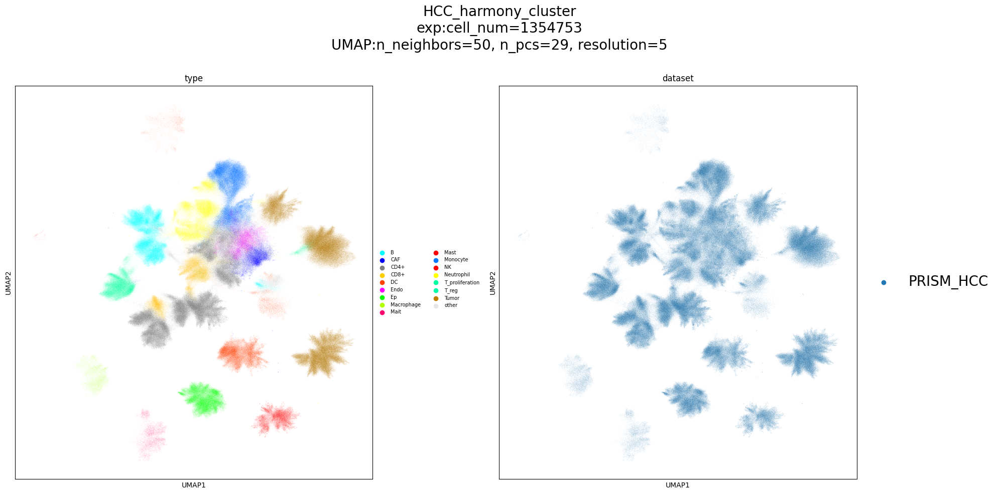

In [386]:
tmp = combine_adata_st[~combine_adata_st.obs['tmp_leiden'].isin(['-2','-1'])]
UMAP_leiden_plot(adata=tmp, 
                 color='type', FOI=FOI, palette=type_colormap,
                 save=True, out_path=r'E:/TMC/cell_typing/results/2023.9.28-_PRISM_HCC_final_downstream_analysis/figures/2_UMAP_type.png',dpi=300, datatype='harmony',legend_loc='right margin')

# UMAP_genes_plot(adata=tmp,
                # FOI=FOI, save=False, out_path=r'./', datatype='harmony', dataset=['PRISM_HCC'])

## plot gene distribution of each cluster

In [ ]:
for cluster_num in [str(_) for _ in []]:
    cluster=combine_adata_st[combine_adata_st.obs['leiden']==cluster_num].X
    fig, ax = plt.subplots(figsize=(20, 4))
    plt.boxplot(cluster, labels=combine_adata_st.var_names)
    fig.tight_layout()
    fig.suptitle(f'distribution of cluster{cluster_num}')
    plt.show()

# correlation with sc data

In [ ]:
def matrix_for_heatmap(adata_1, adata_2, adata_ori, obs_1="leiden_type", obs_2="leiden", cluster_of_intere=list, sc_cluster_of_intere=list, save=False, whole=False):
    
    raw_cluster_num = len(cluster_of_intere)
    sc_cluster_num = len(sc_cluster_of_intere)
    raw_data_matrix = np.array([])
    raw_data_whole_matrix = np.array([])
    sc_data_matrix = np.array([])

    for cluster_num in cluster_of_intere:
        if whole:
            raw_add_whole = np.array([np.mean(adata_ori[adata_1[adata_1.obs[obs_1] == str(cluster_num)].obs.index].X,axis=0,)])
            if raw_data_whole_matrix.size == 0: raw_data_whole_matrix = raw_add_whole
            else: raw_data_whole_matrix = np.concatenate((raw_data_whole_matrix, raw_add_whole), axis=0)

        raw_add = np.array([np.mean(adata_1.X[adata_1.obs[obs_1] == str(cluster_num)],axis=0,)])
        if raw_data_matrix.size == 0: raw_data_matrix = raw_add
        else: raw_data_matrix = np.concatenate((raw_data_matrix, raw_add), axis=0)


    for cluster_num in sc_cluster_of_intere:
        sc_add = np.array([np.mean(adata_2.X[adata_2.obs[obs_2] == str(cluster_num)], axis=0)])
        if sc_data_matrix.size == 0: sc_data_matrix = sc_add
        else: sc_data_matrix = np.concatenate((sc_data_matrix, sc_add), axis=0)

    matrix = np.concatenate((raw_data_matrix, sc_data_matrix), axis=0)
    corr_matrix = np.corrcoef(matrix)
    if whole: return raw_data_whole_matrix, sc_data_matrix, corr_matrix[0 : raw_cluster_num, raw_cluster_num : raw_cluster_num + sc_cluster_num]
    else: return raw_data_matrix, sc_data_matrix, corr_matrix[0 : raw_cluster_num, raw_cluster_num : raw_cluster_num + sc_cluster_num]

## cluster of sc data

In [ ]:
adata_sc_subset = adata_sc1_subset.concatenate(adata_sc2_subset, adata_sc3_subset, batch_key="dataset", batch_categories=["GSE151530", "GSE140228", "CNP0000650"])
# adata_sc_subset = combine_adata[combine_adata.obs.dataset.isin(['GSE151530','GSE140228','CNP0000650'])]

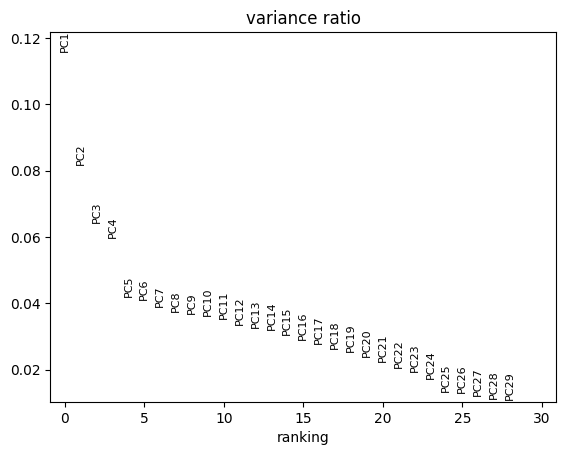

2023-09-20 19:47:26,604 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


AnnData object with n_obs × n_vars = 30797 × 30
    obs: 'dataset', 'layer', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'type', 'leiden', 'sample', 'tissue'
    var: 'n_cells_by_counts-CNP0000650', 'mean_counts-CNP0000650', 'log1p_mean_counts-CNP0000650', 'pct_dropout_by_counts-CNP0000650', 'total_counts-CNP0000650', 'log1p_total_counts-CNP0000650', 'n_cells-CNP0000650', 'mean-CNP0000650', 'std-CNP0000650', 'n_cells_by_counts-GSE140228', 'mean_counts-GSE140228', 'log1p_mean_counts-GSE140228', 'pct_dropout_by_counts-GSE140228', 'total_counts-GSE140228', 'log1p_total_counts-GSE140228', 'n_cells-GSE140228', 'mean-GSE140228', 'std-GSE140228', 'n_cells_by_counts-GSE151530', 'mean_counts-GSE151530', 'log1p_mean_counts-GSE151530', 'pct_dropout_by_counts-GSE151530', 'total_counts-GSE151530', 'log1p_total_counts-GSE151530', 'n_cells-GSE151530', 'mean-GSE151530', 'std-GSE151530', 'n_cells_by_counts-PRISM_HCC', 'mean_counts-PRISM_H

2023-09-20 19:47:52,815 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-09-20 19:47:52,953 - harmonypy - INFO - Iteration 1 of 30
2023-09-20 19:48:03,006 - harmonypy - INFO - Iteration 2 of 30
2023-09-20 19:48:13,143 - harmonypy - INFO - Iteration 3 of 30
2023-09-20 19:48:23,193 - harmonypy - INFO - Iteration 4 of 30
2023-09-20 19:48:32,875 - harmonypy - INFO - Iteration 5 of 30
2023-09-20 19:48:38,282 - harmonypy - INFO - Iteration 6 of 30
2023-09-20 19:48:42,861 - harmonypy - INFO - Converged after 6 iterations


In [ ]:
adata_sc_subset = adata_sc_subset[:, list_of_variable_names]
sc.tl.pca(adata_sc_subset, n_comps=29)
sc.pl.pca_variance_ratio(adata_sc_subset, log=False)

h_pcs = 29
sc.tl.pca(adata_sc_subset, n_comps=h_pcs)
print(adata_sc_subset)

import scanpy.external as sce
sce.pp.harmony_integrate(
    adata_sc_subset,
    "dataset",
    "X_pca",
    "X_pca_harmony",
    max_iter_harmony=30,
    # max_iter_kmeans=30,
)

neighbor = 50
sc.pp.neighbors(adata_sc_subset, n_neighbors=neighbor, use_rep="X_pca_harmony")
sc.tl.umap(adata_sc_subset)

In [ ]:
leiden_resolution=1
sc.tl.leiden(adata_sc_subset, resolution=leiden_resolution)

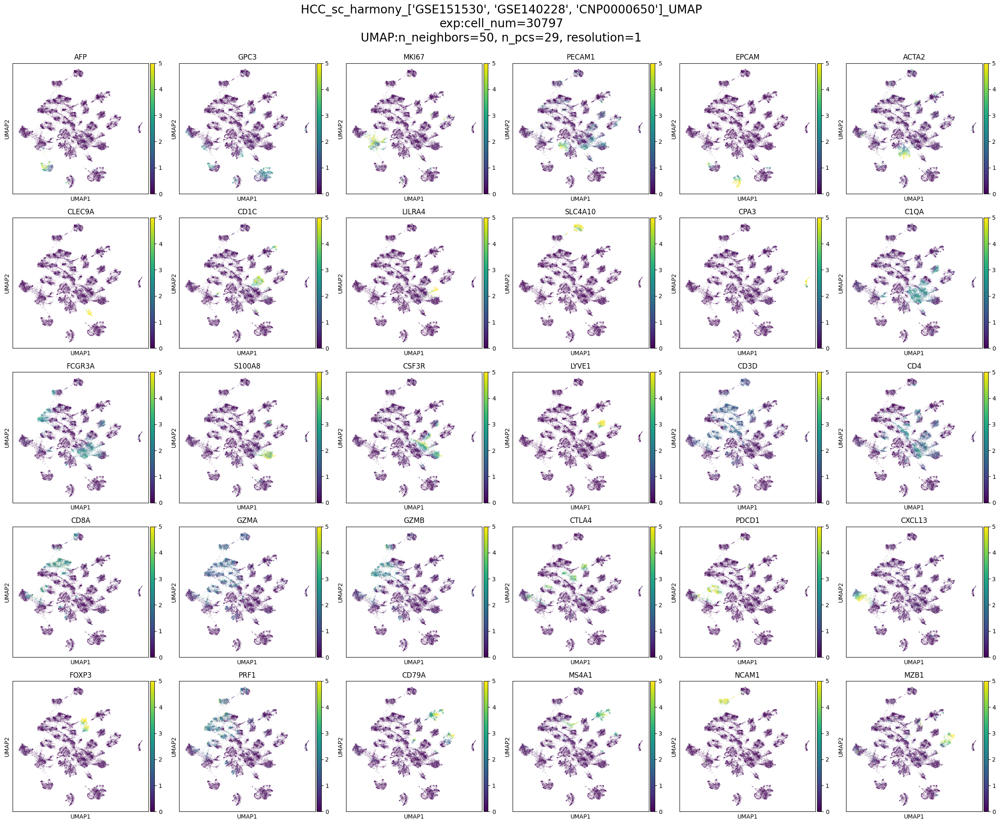

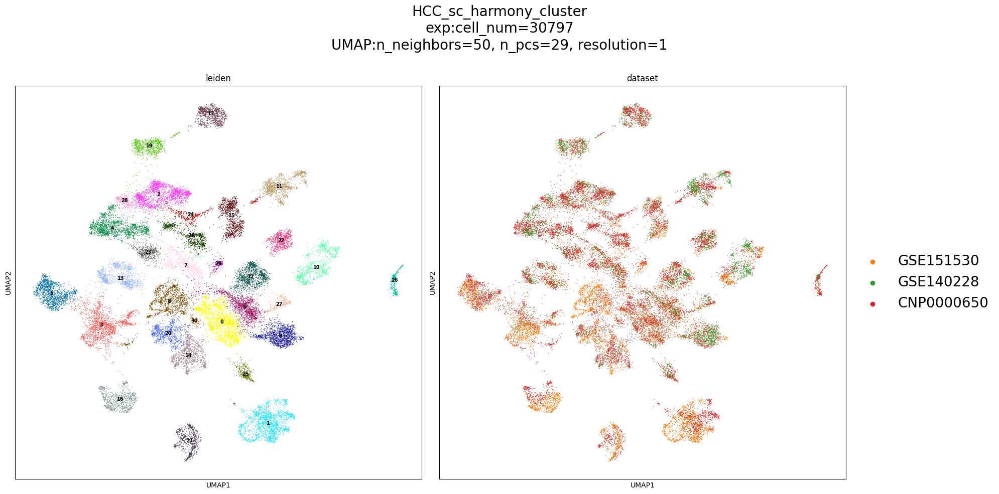

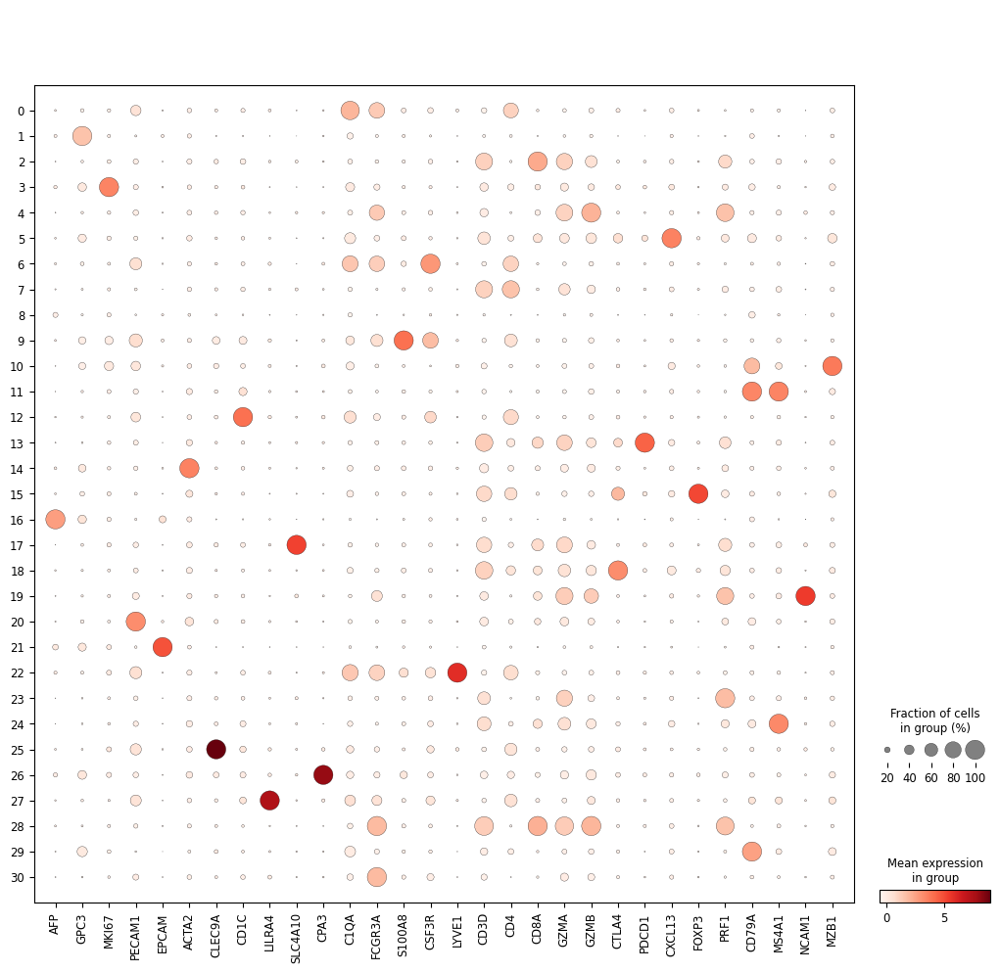

In [67]:
UMAP_genes_plot(adata=adata_sc_subset, size=1, FOI=FOI, save=False, out_path=out_path, datatype='sc_harmony', dataset=['GSE151530','GSE140228','CNP0000650'])
UMAP_leiden_plot(adata=adata_sc_subset, FOI=FOI, color='leiden', save=False, out_path=out_path, datatype='sc_harmony', DOI=['GSE151530','GSE140228','CNP0000650'])
sc.pl.dotplot(adata_sc_subset, var_names=adata_sc_subset.var.index, groupby='leiden')

## calculate of coor matrix

In [ ]:
combine_adata_st = sc.read_h5ad(r'e:\TMC\.lib_legacy\cell_typing\results\2023.9.28-10.17_PRISM_HCC_3D_Pseudo\2023.10.3_corr&neighbor_enrichment\adata_neighborhood_enrichment.h5ad')
adata_sc_subset = sc.read_h5ad(r'E:\TMC\.lib_legacy\cell_typing\results\2023.8.21-10.12_PRISM_HCC_2D\2023.10.12_leiden_final_typed\adata_sc_subset_retyped.h5ad')
adata = sc.read_h5ad(r'E:\TMC\.lib_legacy\cell_typing\results\2023.9.14-9.22_PRISM_HCC_3D_Pseudo_trials\2023.9.19-9.22_PRISM_HCC_20_layers_min_counts=7, max_counts=200, min_genes=2\direct\adata_temp.h5ad')
adata_sc_subset = sc.read_h5ad(r'E:\TMC\.lib_legacy\cell_typing\results\2023.8.21-_PRISM_HCC_one_layer\2023.10.12_leiden_final_typed\adata_sc_subset_res=4,retyped_by_zch.h5ad')

In [376]:
cluster_of_intere = list(cluster_rough_dict.keys())
raw_data_matrix, sc_data_matrix, corr_matrix = matrix_for_heatmap(
    combine_adata_st, 
    adata_sc_subset, 
    combine_adata_st, 
    obs_1="type", 
    obs_2="type", 
    cluster_of_intere=cluster_of_intere, 
    sc_cluster_of_intere=cluster_of_intere, 
    save=False, 
    whole=False
    )

## plot heatmaps

### exp data

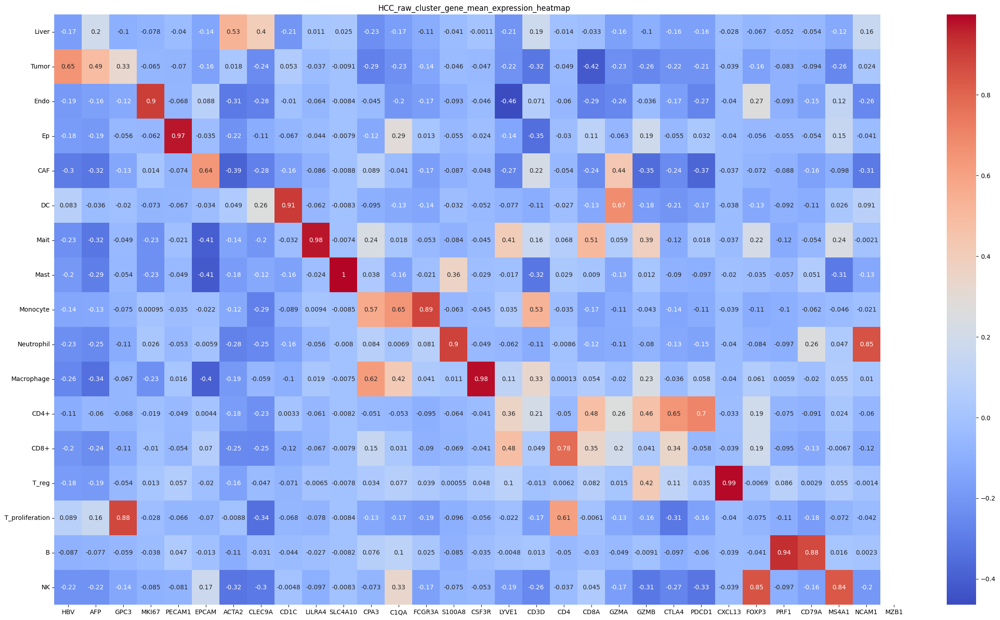

In [55]:
save=False
raw_plot = raw_data_matrix.copy()
for i in range(raw_plot.shape[1]):
    raw_plot[:, i] = raw_plot[:, i] / np.linalg.norm(raw_plot[:, i])
# for i in range(raw_plot.shape[0]):
#     raw_plot[i, :] = raw_plot[i, :] / np.linalg.norm(raw_plot[i, :])


plt.figure(figsize=(raw_plot.shape[1], raw_plot.shape[0]))
sns.heatmap(
    raw_plot,
    cmap="coolwarm",
    annot=True,
    yticklabels=ystick,
    xticklabels=list(adata.var_names),
    # vmax=2,
    # vmin=-0.5,
)
plt.title(f"{FOI}_raw_cluster_gene_mean_expression_heatmap")
if save:
    np.savetxt(
        f"{out_path}/{FOI}_raw_cluster_gene_mean_expression_heatmap.csv", raw_plot,delimiter=","
    )
    plt.savefig(
        f"{out_path}/{FOI}_raw_cluster_gene_mean_expression_heatmap.pdf"
    )
else:
    plt.show()

### sc data

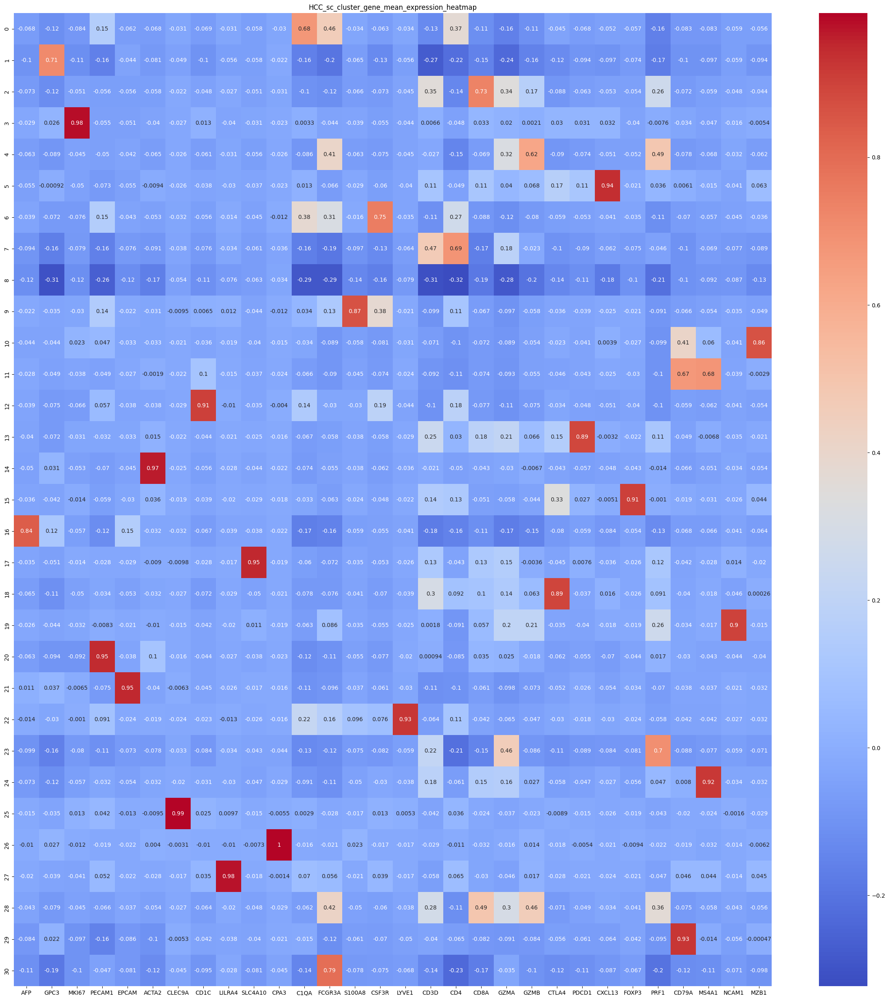

In [56]:
save=False
sc_plot = sc_data_matrix.copy()
for i in range(sc_plot.shape[0]):
    sc_plot[i, :] = sc_plot[i, :] / np.linalg.norm(sc_plot[i, :])

# for i in range(sc_plot.shape[1]):
#     sc_plot[:, i] = sc_plot[:, i] / np.linalg.norm(sc_plot[:, i])

plt.figure(figsize=(sc_plot.shape[1], sc_plot.shape[0]))
sns.heatmap(
    sc_plot,
    cmap="coolwarm",
    annot=True,
    # yticklabels=sc_clus_dict.keys(),
    xticklabels=list(adata_sc_subset.var_names),
)
plt.title(f"{FOI}_sc_cluster_gene_mean_expression_heatmap")
if save:
    np.savetxt(
        f"{out_path}/{FOI}_sc_cluster_gene_mean_expression_heatmap.csv", sc_plot,delimiter=","
    )
    plt.savefig(
        f"{out_path}/{FOI}_sc_cluster_gene_mean_expression_heatmap.pdf"
    )
else:
    plt.show()

### exp_data vs. sc_data

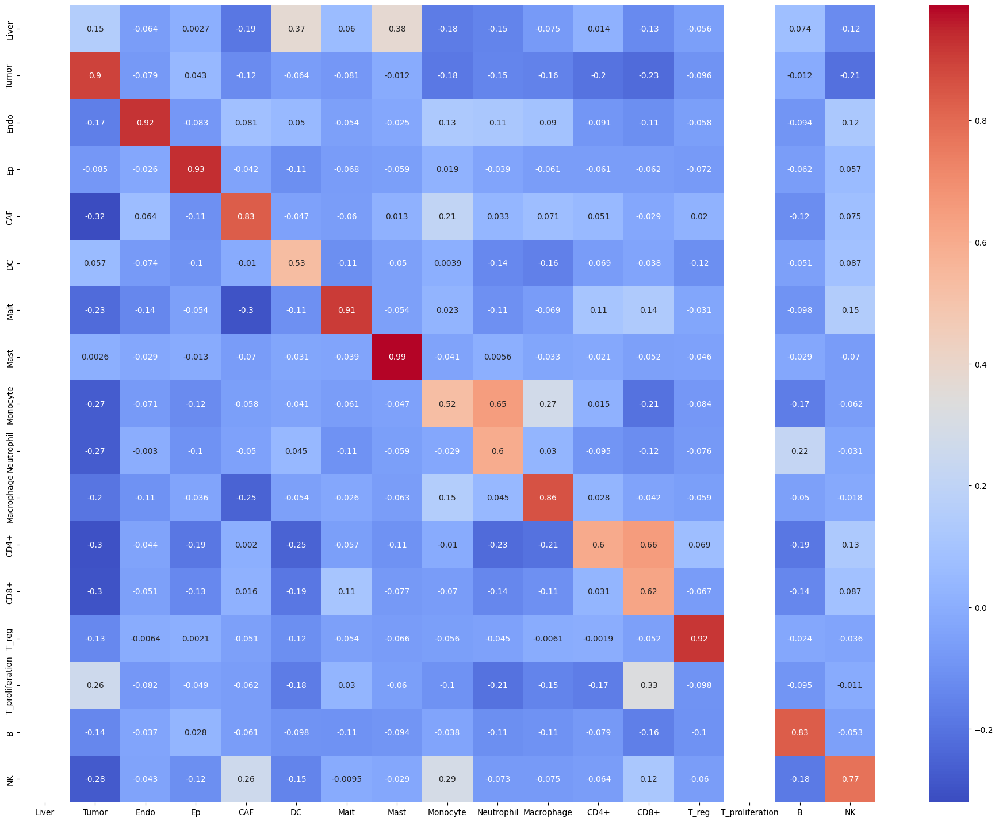

In [382]:
# map_plot of raw vs. sc cluster
map_plot = pd.DataFrame(corr_matrix, columns=cluster_of_intere, index=cluster_of_intere)
df = map_plot.copy()
# all_nan_columns = df.columns[df.isna().all()].tolist()
# all_nan_rows = df.index[df.isna().all(axis=1)].tolist()
# union_set = set(all_nan_columns).union(all_nan_rows)
# df = df.drop(union_set, axis=0)
# df = df.drop(union_set, axis=1)


plt.figure(figsize=(24, 18))
heatmap = sns.heatmap(
    df,
    cmap="coolwarm",
    annot=True,
    # yticklabels=cluster_of_intere,
    # xticklabels=cluster_of_intere,
    # vmin=0,
    # vmax=0.6,
)
# plt.show()
df = pd.DataFrame(map_plot, columns=cluster_of_intere, index=cluster_of_intere)
df.to_csv(r'E:\TMC\cell_typing\results\2023.9.28-_PRISM_HCC_final_downstream_analysis\figures\5_vs_subtype_heatmap_sc_retyped_by_zch_dropna_reordered.csv')
plt.savefig(r'E:\TMC\cell_typing\results\2023.9.28-_PRISM_HCC_final_downstream_analysis\figures\5_vs_subtype_heatmap_sc_retyped_by_zch_dropna_reordered.pdf', bbox_inches = 'tight')

## correlation of single cell with bulk rna

In [13]:
adata = sc.read_h5ad(r'results/2023.9.28-10.17_PRISM_HCC_3D_Pseudo/adata_PRISM_HCC_3D_pseudo_harmony_category_reordered.h5ad')
adata_sc = sc.read_h5ad(r'E:\TMC\.lib_legacy\cell_typing\results\2023.8.21-10.12_PRISM_HCC_2D\2023.10.12_leiden_final_typed\adata_sc_subset_res=4,retyped_by_zch.h5ad')

In [18]:
adata.obs['type']

1                other
5                other
6                other
7                 CD4+
8           Neutrophil
               ...    
128097-1            NK
128103-3    Neutrophil
128104-2          CD4+
128116-1    Neutrophil
128117-2    Neutrophil
Name: type, Length: 1794158, dtype: category
Categories (18, object): ['Tumor', 'Liver', 'DC', 'T_proliferation', ..., 'T_reg', 'B', 'Ep', 'other']

In [17]:
adata_sc.obs['type']

6-GSE151530              Macrophage
11-GSE151530                  Tumor
18-GSE151530                   CD8+
22-GSE151530                  Tumor
26-GSE151530                  Tumor
                            ...    
P19_T_0138-CNP0000650          CD8+
P19_T_0139-CNP0000650         Tumor
P19_T_0143-CNP0000650         Tumor
P19_T_0144-CNP0000650         T_reg
P19_T_0146-CNP0000650          CD8+
Name: type, Length: 35189, dtype: category
Categories (16, object): ['B', 'CAF', 'CD4+', 'CD8+', ..., 'Neutrophil', 'T_reg', 'Tumor', 'other']

# .legacy


cell_num: 1926
CPA3_minima: [15.078412603139876, 18.24482515990734]
AFP_minima: [-3.47058651804924]
GPC3_minima: [-2.693294289112091, -0.013250060081481774, 0.6783742570877074]
ACTA2_minima: [-0.6534164249897003]
PECAM1_minima: [-0.03667286634445188, 2.8264152348041534]


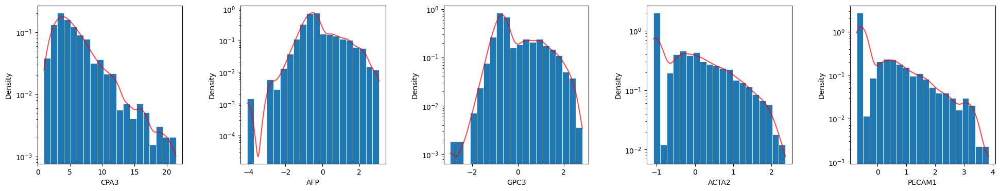

In [ ]:
# minima_dict = {'CPA3':'','AFP':'','GPC3':'','ACTA2':'','PECAM1':''}
# gene_sublist = [_ for _ in minima_dict.keys()]
# cluster_list_temp=[]
# for _ in cluster_dict.keys():
#     if "CPA3" in _:
#         cluster_list_temp += [str(_) for _ in cluster_dict[_]]
# cluster = combine_adata_st[combine_adata_st.obs.leiden.isin(cluster_list_temp)]
# print(f'cell_num: {len(cluster)}')

# fig, ax = plt.subplots(nrows=1,ncols=5,figsize=(24, 4))
# for i, gene in enumerate(gene_sublist):
#     a = [float(_) for _ in cluster[:, gene].X]
#     sns.histplot(a, bins=20, stat='density', alpha= 1, kde=True,
#                 edgecolor='white', linewidth=0.5,
#                 log=True, 
#                 ax=ax[i],
#                 line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'))
#     ax[i].get_lines()[0].set_color('red') # edit line color due to bug in sns v 0.11.0
#     ax[i].set_xlabel(gene)

#     y = ax[i].get_lines()[0].get_ydata()
#     minima_dict[gene] = [float(_/len(y)*(max(a)-min(a))+min(a)) for _ in argrelextrema(np.array(y), np.less)[0]]
#     print(f'{gene}_minima: {minima_dict[gene]}')
#     fig.subplots_adjust(hspace=0.4)
#     fig.subplots_adjust(wspace=0.4)
# plt.show()

In [ ]:
# cluster.obs['new_leiden'] = ['-1']*len(cluster)
# thre_min = [True, False, False, False, False]
# minima_dict['GPC3'].pop(0)
# minima_dict['AFP'][0]=0
# for _, gene in enumerate(gene_sublist):
#     minima = minima_dict[gene]
#     if thre_min[_]:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['1']*len(tmp)
#         tmp = cluster[cluster[:, gene].X < minima[0]]
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)
#     else:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['-1']*len(tmp)
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)

# cell_to_plot = len(cluster[cluster.obs['new_leiden']=='1'])
# print(f'filtered {cell_to_plot} cells')

filtered 17 cells


cell_num: 3421
LYVE1_minima: [9.16546828508377, 11.121774450540542]
AFP_minima: [-1.912125587463379, 0.18347873687744132, 3.0358290672302246]
GPC3_minima: [-0.08231310606002795]
ACTA2_minima: [-0.6342185235023499]
PECAM1_minima: [0.12722643375396725]


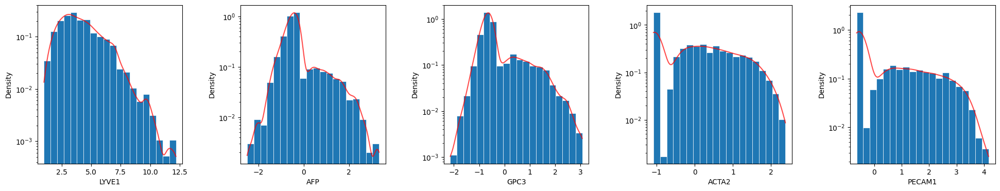

In [ ]:
# minima_dict = {'LYVE1':'','AFP':'','GPC3':'','ACTA2':'','PECAM1':''}
# gene_sublist = [_ for _ in minima_dict.keys()]
# # cluster = combine_adata_st.copy()
# # cluster = combine_adata_st[combine_adata_st.obs.leiden.isin(['3'])]
# # cluster = combine_adata_st[combine_adata_st.obs.leiden.isin([str(_) for _ in cluster_dict['Macrophage-LYVE1+']])]
# cluster_list_temp=[]
# for _ in cluster_dict.keys():
#     if "LYVE" in _:
#         cluster_list_temp += [str(_) for _ in cluster_dict[_]]
# cluster = combine_adata_st[combine_adata_st.obs.leiden.isin(cluster_list_temp)]
# print(f'cell_num: {len(cluster)}')

# fig, ax = plt.subplots(nrows=1,ncols=5,figsize=(24, 4))
# for i, gene in enumerate(gene_sublist):
#     a = [float(_) for _ in cluster[:, gene].X]
#     sns.histplot(a, bins=20, stat='density', alpha= 1, kde=True,
#                 edgecolor='white', linewidth=0.5,
#                 log=True, 
#                 ax=ax[i],
#                 line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'))
#     ax[i].get_lines()[0].set_color('red') # edit line color due to bug in sns v 0.11.0
#     ax[i].set_xlabel(gene)

#     y = ax[i].get_lines()[0].get_ydata()
#     minima_dict[gene] = [float(_/len(y)*(max(a)-min(a))+min(a)) for _ in argrelextrema(np.array(y), np.less)[0]]
#     print(f'{gene}_minima: {minima_dict[gene]}')
#     fig.subplots_adjust(hspace=0.4)
#     fig.subplots_adjust(wspace=0.4)

# plt.show()

In [ ]:
# cluster.obs['new_leiden'] = ['-1']*len(cluster)
# thre_min = [True, False, False, False, False]
# minima_dict['LYVE1'][0] = 0
# minima_dict['AFP'].pop(0)
# for _, gene in enumerate(gene_sublist):
#     minima = minima_dict[gene]
#     if thre_min[_]:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['1']*len(tmp)
#         tmp = cluster[cluster[:, gene].X < minima[0]]
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)
#     else:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['-1']*len(tmp)
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)

# cell_to_plot = len(cluster[cluster.obs['new_leiden']=='1'])
# print(f'filtered {cell_to_plot} cells')

filtered 425 cells


cell_num: 3322
SLC4A10_minima: [5.537346198558807]
AFP_minima: [0.24215816259384138, 2.8931508421897885, 3.417826476693153]
GPC3_minima: [-0.010411692857742239]
ACTA2_minima: [-0.5593017721176148]
PECAM1_minima: [0.04181560277938845]


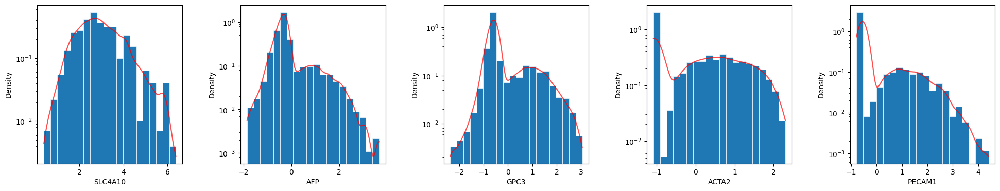

In [ ]:
# minima_dict = {'SLC4A10':'','AFP':'','GPC3':'','ACTA2':'','PECAM1':''}
# gene_sublist = [_ for _ in minima_dict.keys()]
# # cluster = combine_adata_st.copy()
# # cluster = combine_adata_st[combine_adata_st.obs.leiden.isin(['3'])]
# # cluster = combine_adata_st[combine_adata_st.obs.leiden.isin([str(_) for _ in cluster_dict['SLC4A10']])]
# cluster_list_temp=[]
# for _ in cluster_dict.keys():
#     if "SLC4A10" in _:
#         cluster_list_temp += [str(_) for _ in cluster_dict[_]]
# cluster = combine_adata_st[combine_adata_st.obs.leiden.isin(cluster_list_temp)]
# print(f'cell_num: {len(cluster)}')

# fig, ax = plt.subplots(nrows=1,ncols=5,figsize=(24, 4))
# for i, gene in enumerate(gene_sublist):
#     a = [float(_) for _ in cluster[:, gene].X]
#     sns.histplot(a, bins=20, stat='density', alpha= 1, kde=True,
#                 edgecolor='white', linewidth=0.5,
#                 log=True, 
#                 ax=ax[i],
#                 line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'))
#     ax[i].get_lines()[0].set_color('red') # edit line color due to bug in sns v 0.11.0
#     ax[i].set_xlabel(gene)

#     y = ax[i].get_lines()[0].get_ydata()
#     minima_dict[gene] = [float(_/len(y)*(max(a)-min(a))+min(a)) for _ in argrelextrema(np.array(y), np.less)[0]]
#     print(f'{gene}_minima: {minima_dict[gene]}')
#     fig.subplots_adjust(hspace=0.4)
#     fig.subplots_adjust(wspace=0.4)

# plt.show()

In [ ]:
# cluster.obs['new_leiden'] = ['-1']*len(cluster)
# thre_min = [True, False, False, False, False]
# minima_dict['SLC4A10'][0] = 0
# # minima_dict['AFP'].pop(0)
# for _, gene in enumerate(gene_sublist):
#     minima = minima_dict[gene]
#     if thre_min[_]:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['1']*len(tmp)
#         tmp = cluster[cluster[:, gene].X < minima[0]]
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)
#     else:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['-1']*len(tmp)
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)

# cell_to_plot = len(cluster[cluster.obs['new_leiden']=='1'])
# print(f'filtered {cell_to_plot} cells')

filtered 592 cells


cell_num: 5652
CLEC9A_minima: [5.527083463072777]
AFP_minima: [0.21417247653007498]
GPC3_minima: [-0.06943959772586816]
ACTA2_minima: [-0.6946627569198609]
PECAM1_minima: [-0.11506845474243166, 3.947078948020935]


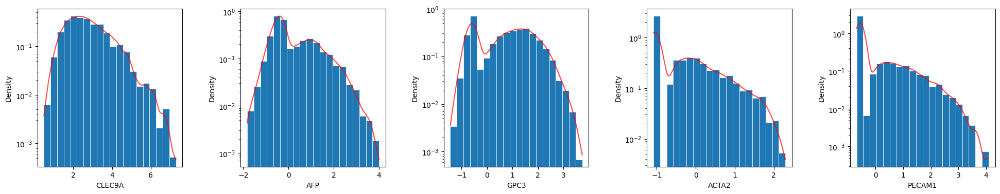

In [ ]:
# minima_dict = {'CLEC9A':'','AFP':'','GPC3':'','ACTA2':'','PECAM1':''}
# gene_sublist = [_ for _ in minima_dict.keys()]
# # cluster = combine_adata_st.copy()
# # cluster = combine_adata_st[combine_adata_st.obs.leiden.isin(['0'])]
# # cluster = combine_adata_st[combine_adata_st.obs.leiden.isin([str(_) for _ in cluster_dict['cDC1_CLEC9A']])]
# cluster_list_temp=[]
# for _ in cluster_dict.keys():
#     if "CLEC9A" in _:
#         cluster_list_temp += [str(_) for _ in cluster_dict[_]]
# cluster = combine_adata_st[combine_adata_st.obs.leiden.isin(cluster_list_temp)]
# print(f'cell_num: {len(cluster)}')

# fig, ax = plt.subplots(nrows=1,ncols=5,figsize=(24, 4))
# for i, gene in enumerate(gene_sublist):
#     a = [float(_) for _ in cluster[:, gene].X]
#     sns.histplot(a, bins=20, stat='density', alpha= 1, kde=True,
#                 edgecolor='white', linewidth=0.5,
#                 log=True, 
#                 ax=ax[i],
#                 line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'))
#     ax[i].get_lines()[0].set_color('red') # edit line color due to bug in sns v 0.11.0
#     ax[i].set_xlabel(gene)

#     y = ax[i].get_lines()[0].get_ydata()
#     minima_dict[gene] = [float(_/len(y)*(max(a)-min(a))+min(a)) for _ in argrelextrema(np.array(y), np.less)[0]]
#     print(f'{gene}_minima: {minima_dict[gene]}')
#     fig.subplots_adjust(hspace=0.4)
#     fig.subplots_adjust(wspace=0.4)
# plt.show()

In [ ]:
# cluster.obs['new_leiden'] = ['-1']*len(cluster)
# thre_min = [True, False, False, False, False]
# minima_dict['CLEC9A'][0] = 0
# for _, gene in enumerate(gene_sublist):
#     minima = minima_dict[gene]
#     if thre_min[_]:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['1']*len(tmp)
#         tmp = cluster[cluster[:, gene].X < minima[0]]
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)
#     else:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['-1']*len(tmp)
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)

# cell_to_plot = len(cluster[cluster.obs['new_leiden']=='1'])
# print(f'filtered {cell_to_plot} cells')

filtered 347 cells


cell_num: 4532
CD1C_minima: [0.2299060137569905, 5.567863706797361, 6.675741718560457, 7.934694004654883, 9.092930107861758]
AFP_minima: [0.198776400089264]
GPC3_minima: [-0.03623643636703466]
ACTA2_minima: [-0.6084428679943085]
PECAM1_minima: [-0.026549845933914185]


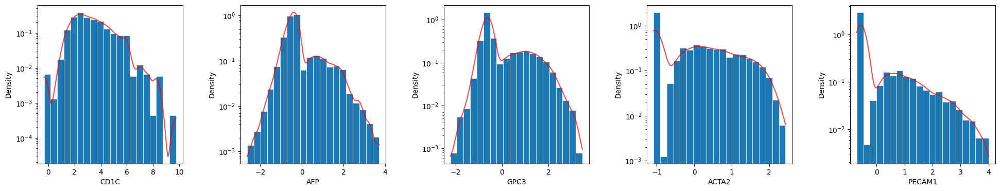

In [ ]:
# minima_dict = {'CD1C':'','AFP':'','GPC3':'','ACTA2':'','PECAM1':''}
# gene_sublist = [_ for _ in minima_dict.keys()]
# # cluster = combine_adata_st[combine_adata_st.obs.leiden.isin([str(_) for _ in [10,63,6,36]])]
# # cluster = combine_adata_st[combine_adata_st.obs.leiden.isin([str(_) for _ in cluster_dict['cDC2']])]
# cluster_list_temp=[]
# for _ in cluster_dict.keys():
#     if "CD1C" in _:
#         cluster_list_temp += [str(_) for _ in cluster_dict[_]]
# cluster = combine_adata_st[combine_adata_st.obs.leiden.isin(cluster_list_temp)]
# print(f'cell_num: {len(cluster)}')

# fig, ax = plt.subplots(nrows=1,ncols=5,figsize=(24, 4))
# for i, gene in enumerate(gene_sublist):
#     a = [float(_) for _ in cluster[:, gene].X]
#     sns.histplot(a, bins=20, stat='density', alpha= 1, kde=True,
#                 edgecolor='white', linewidth=0.5,
#                 log=True, 
#                 ax=ax[i],
#                 line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'))
#     ax[i].get_lines()[0].set_color('red') # edit line color due to bug in sns v 0.11.0
#     ax[i].set_xlabel(gene)

#     y = ax[i].get_lines()[0].get_ydata()
#     minima_dict[gene] = [float(_/len(y)*(max(a)-min(a))+min(a)) for _ in argrelextrema(np.array(y), np.less)[0]]
#     print(f'{gene}_minima: {minima_dict[gene]}')
#     fig.subplots_adjust(hspace=0.4)
#     fig.subplots_adjust(wspace=0.4)
# plt.show()

In [ ]:
# cluster.obs['new_leiden'] = ['-1']*len(cluster)
# thre_min = [True, False, False, False, False]
# # minima_dict['CD1C'][0] = 0
# for _, gene in enumerate(gene_sublist):
#     minima = minima_dict[gene]
#     if thre_min[_]:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['1']*len(tmp)
#         tmp = cluster[cluster[:, gene].X < minima[0]]
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)
#     else:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['-1']*len(tmp)
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)

# cell_to_plot = len(cluster[cluster.obs['new_leiden']=='1'])
# print(f'filtered {cell_to_plot} cells')

filtered 605 cells


cell_num: 3631
MZB1_minima: [-0.21609461903572083, 0.10493503510951996, 6.454188194870949]
AFP_minima: [-3.2230275189876556, 0.2757698750495914]
GPC3_minima: [0.013577785491943217]
ACTA2_minima: [-0.6844333517551422]
PECAM1_minima: [-0.08615926980972288]


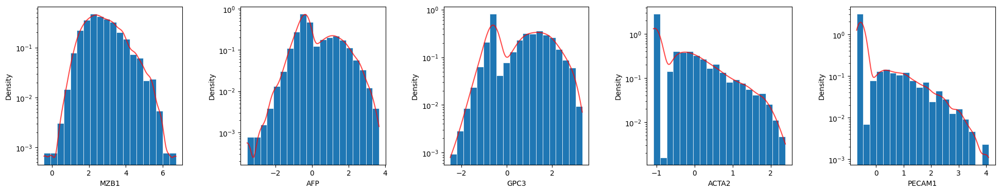

In [ ]:
# minima_dict = {'MZB1':'','AFP':'','GPC3':'','ACTA2':'','PECAM1':''}
# gene_sublist = [_ for _ in minima_dict.keys()]
# # cluster = combine_adata_st[combine_adata_st.obs.leiden.isin([str(_) for _ in [10,63,6,36]])]
# # cluster = combine_adata_st[combine_adata_st.obs.leiden.isin([str(_) for _ in cluster_dict['MZB1']])]
# cluster_list_temp=[]
# for _ in cluster_dict.keys():
#     if "MZB1" in _:
#         cluster_list_temp += [str(_) for _ in cluster_dict[_]]
# cluster = combine_adata_st[combine_adata_st.obs.leiden.isin(cluster_list_temp)]
# print(f'cell_num: {len(cluster)}')

# fig, ax = plt.subplots(nrows=1,ncols=5,figsize=(24, 4))
# for i, gene in enumerate(gene_sublist):
#     a = [float(_) for _ in cluster[:, gene].X]
#     sns.histplot(a, bins=20, stat='density', alpha= 1, kde=True,
#                 edgecolor='white', linewidth=0.5,
#                 log=True, 
#                 ax=ax[i],
#                 line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'))
#     ax[i].get_lines()[0].set_color('red') # edit line color due to bug in sns v 0.11.0
#     ax[i].set_xlabel(gene)

#     y = ax[i].get_lines()[0].get_ydata()
#     minima_dict[gene] = [float(_/len(y)*(max(a)-min(a))+min(a)) for _ in argrelextrema(np.array(y), np.less)[0]]
#     print(f'{gene}_minima: {minima_dict[gene]}')
#     fig.subplots_adjust(hspace=0.4)
#     fig.subplots_adjust(wspace=0.4)
# plt.show()

In [ ]:
# cluster.obs['new_leiden'] = ['-1']*len(cluster)
# thre_min = [True, False, False, False, False]
# minima_dict['AFP'].pop(0)
# for _, gene in enumerate(gene_sublist):
#     minima = minima_dict[gene]
#     if thre_min[_]:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['1']*len(tmp)
#         tmp = cluster[cluster[:, gene].X < minima[0]]
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)
#     else:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['-1']*len(tmp)
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)

# cell_to_plot = len(cluster[cluster.obs['new_leiden']=='1'])
# print(f'filtered {cell_to_plot} cells')

filtered 373 cells


cell_num: 4441
CXCL13_minima: []
AFP_minima: [-2.8436579585075377, 0.18487363219261166]
GPC3_minima: [-0.01289544105529794]
ACTA2_minima: [-0.6177268409729004]
PECAM1_minima: [-0.0923552155494689, 0.5276041507720948]


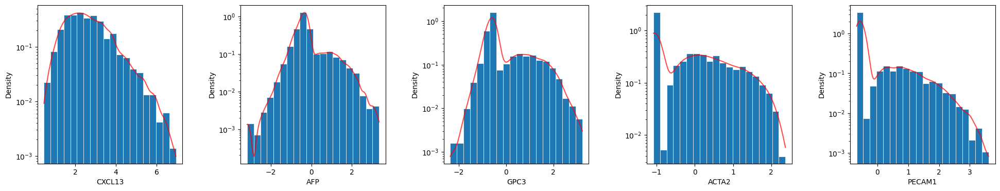

In [ ]:
# minima_dict = {'CXCL13':'','AFP':'','GPC3':'','ACTA2':'','PECAM1':''}
# gene_sublist = [_ for _ in minima_dict.keys()]
# # cluster = combine_adata_st[combine_adata_st.obs.leiden.isin([str(_) for _ in [10,63,6,36]])]
# # cluster = combine_adata_st[combine_adata_st.obs.leiden.isin([str(_) for _ in cluster_dict["T-CD4+-Cxcl13+"]])]
# cluster_list_temp=[]
# for _ in cluster_dict.keys():
#     if "CXCL13" in _:
#         cluster_list_temp += [str(_) for _ in cluster_dict[_]]
# cluster = combine_adata_st[combine_adata_st.obs.leiden.isin(cluster_list_temp)]
# print(f'cell_num: {len(cluster)}')

# fig, ax = plt.subplots(nrows=1,ncols=5,figsize=(24, 4))
# for i, gene in enumerate(gene_sublist):
#     a = [float(_) for _ in cluster[:, gene].X]
#     sns.histplot(a, bins=20, stat='density', alpha= 1, kde=True,
#                 edgecolor='white', linewidth=0.5,
#                 log=True, 
#                 ax=ax[i],
#                 line_kws=dict(color='black', alpha=0.7, linewidth=1.5, label='KDE'))
#     ax[i].get_lines()[0].set_color('red') # edit line color due to bug in sns v 0.11.0
#     ax[i].set_xlabel(gene)

#     y = ax[i].get_lines()[0].get_ydata()
#     minima_dict[gene] = [float(_/len(y)*(max(a)-min(a))+min(a)) for _ in argrelextrema(np.array(y), np.less)[0]]
#     print(f'{gene}_minima: {minima_dict[gene]}')
#     fig.subplots_adjust(hspace=0.4)
#     fig.subplots_adjust(wspace=0.4)
# plt.show()

In [ ]:
# cluster.obs['new_leiden'] = ['-1']*len(cluster)
# thre_min = [True, False, False, False, False]
# minima_dict['CXCL13'] = [0]
# minima_dict['AFP'].pop(0)
# for _, gene in enumerate(gene_sublist):
#     minima = minima_dict[gene]
#     if thre_min[_]:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['1']*len(tmp)
#         tmp = cluster[cluster[:, gene].X < minima[0]]
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)
#     else:
#         tmp = cluster[cluster[:, gene].X > minima[0]]
#         cluster.obs['new_leiden'][tmp.obs.index] = ['-1']*len(tmp)
#         cluster_to_plot.obs['new_leiden'][tmp.obs.index] = ['-2']*len(tmp)

# cell_to_plot = len(cluster[cluster.obs['new_leiden']=='1'])
# print(f'filtered {cell_to_plot} cells')

filtered 729 cells
